```
##################################################################
┌──────────────────────────────────────────────────────────────┐   
│................/ __\__ _ _ __| |__...___.._.__...............│  
│.............../ /  / _` | '__| '_ \./ _ \| '_ \..............│  
│............../ /__| (_| | |..| |_) | (_) | |.| |.............│  
│..............\____/\__,_|_|..|_.__/.\___/|_|.|_|.............│   
│...../\/\...___| |_.__._| |.___._.__..___..___..___...........│  
│..../    \./ _ \ __/ _` | |/ _ \ '_ \/ __|/ _ \/ __|.._____...│  
│.../ /\/\ \  __/ || (_| | |  __/ |.| \__ \  __/\__ \.|_____|..│  
│...\/....\/\___|\__\__,_|_|\___|_|.|_|___/\___||___/..........│  
│................../ _ (_)_.__...__._..___._.__................│  
│................./ /_\/ | '_ \./ _` |/ _ \ '__|...............│  
│................/ /_\\| | |.| | (_| |  __/ |..................│  
│................\____/|_|_|.|_|\__, |\___|_|..................│  
│...............................|___/..........................│  
└──────────────────────────────────────────────────────────────┘  
##################################################################
```

In [1]:
import meep as mp
import numpy as np
from matplotlib import pyplot as plt
%config InlineBackend.figure_format ='retina'
import os
import uuid
import subprocess
import pickle
import time
import sys
from matplotlib.colors import ListedColormap, LogNorm
import h5py
home_folder = os.path.expanduser('~')

if sys.platform == 'darwin':
    sys.path.append(os.path.join(home_folder,
                    'Google Drive/Zia Lab/Codebase/zialab'))
else:
    print("Make amends for Windows or your other OS.")
sys.path.append(os.getcwd())

%reload_ext autoreload
%autoreload 2
from cem.metalenses_2 import *
import datetime
from tabulate import tabulate
import pyperclip

# Finite Conjugate H=20 um, d=50um, R=25, w=5, 250 nm pitch (test of cleaned-up script)

### S4 - bootstrap

In [2]:
simulation_parameters = {
                        'wavelength': 0.532,
                        'post_width': 0.075,
                        'post_height': 0.600,
                        'cell_width': 0.25,
                        'epsilon': 5.8418,
                        'num_G' : 70,
                        'x_coord': 0,
                        'y_coord': 0,
                        'sim_id' : str(int(time.time())),
                        's_amp': 0, 'p_amp': 1,
                        'finite_conjugate': True}
simulation_parameters = expand_sim_params(simulation_parameters)

In [3]:
results = post_phase(simulation_parameters)

In [4]:
post_widths = np.linspace(0.05,0.2,20)
phases = []
simulation_parameters['field_height'] = simulation_parameters['post_height']
for p_width in post_widths:
    simulation_parameters['post_width'] = p_width
    simulation_parameters = expand_sim_params(simulation_parameters)
    results = post_phase(simulation_parameters)
    Exr = results[0]
    Eyr = results[1]
    Ezr = results[2]
    Exi = results[3]
    Eyi = results[4]
    Ezi = results[5] 
    phases.append(np.arctan2(Exi, Exr))
phases = np.array(phases)
phases = np.unwrap(phases)
phases = phases - phases[0]
critical_width = np.interp(2*np.pi*1.01,phases,post_widths)
print(critical_width)

0.19421068187715892


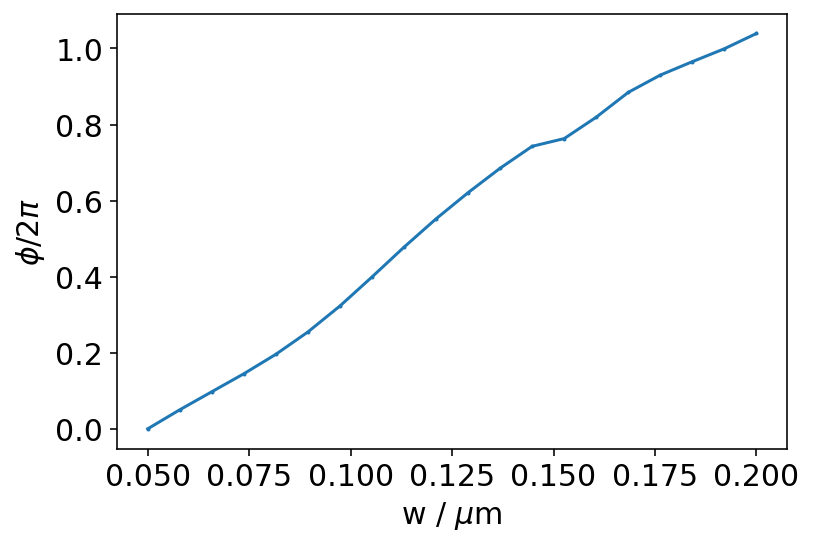

In [5]:
plt.rcParams.update({'font.size': 15})
plt.figure()
plt.plot(post_widths,phases / (2*np.pi),'o-',ms=1.)
plt.xlabel('w / $\mu$m')
plt.ylabel('$\phi/2\pi$')
plt.show()

In [6]:
print(simulation_parameters['sim_id'])
pickle.dump({'post_widths':post_widths,'phases': phases,
             'simulation_parameters': simulation_parameters},
            open('carbon-phases-%s.pkl' % simulation_parameters['sim_id'],'wb'))

1585666549


### MEEP - run

In [7]:
sim_fname =  '/Users/juan/Google Drive/Zia Lab/CEM/MEEP/carbon-phases-%s.pkl' % simulation_parameters['sim_id']
post_widths = pickle.load(open(sim_fname,'rb'))['post_widths']
phases = pickle.load(open(sim_fname,'rb'))['phases']
simulation_parameters = pickle.load(open(sim_fname,'rb'))['simulation_parameters']

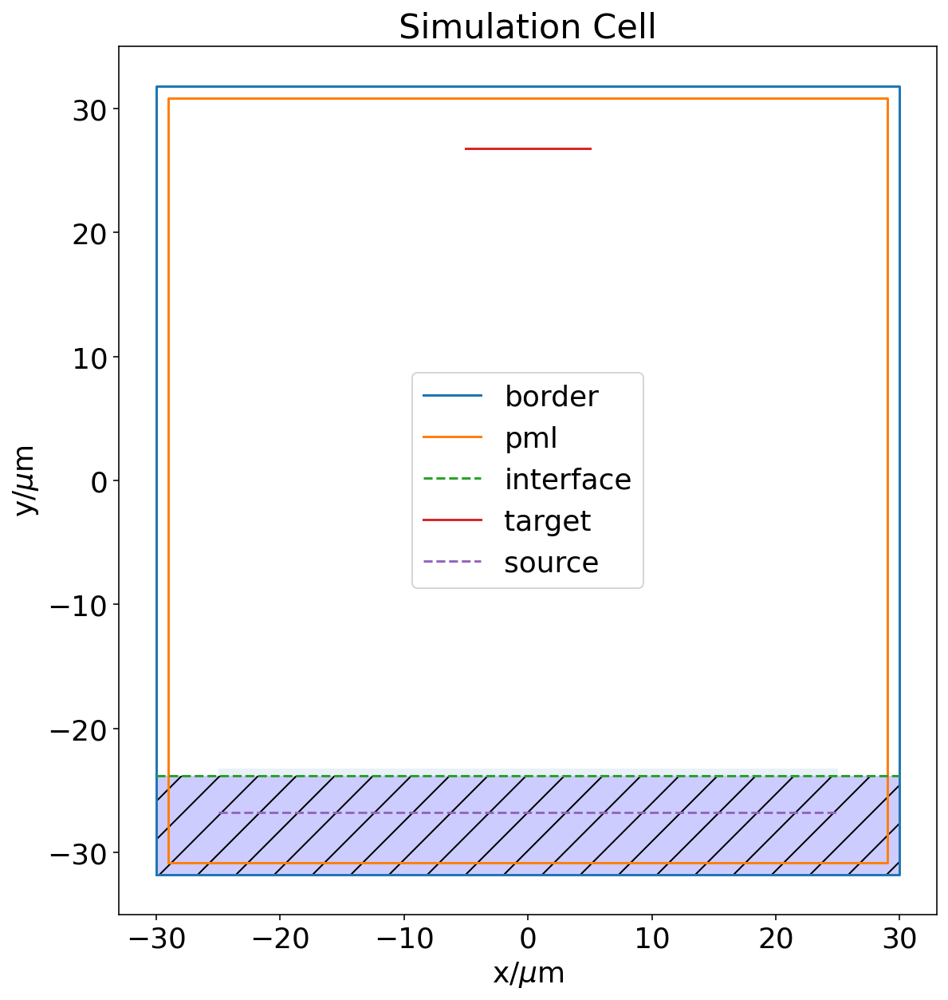

In [9]:
metalens = {
    'post_height':simulation_parameters['post_height'],
    'R': 25,
    'd': 50.,
    's': 3.,
    'H': 20,
    'gap': 4,
    'w': 5,
    'unit cell size': simulation_parameters['cell_width'],
    'epsilon': simulation_parameters['epsilon'],
    'phases': phases,
    'widths': post_widths,
    'wavelength': simulation_parameters['wavelength'],
    'min_width': 0.05,
    'pml_width': 1,
    'resolution': 30.,
    'sim_id': simulation_parameters['sim_id'],
    'simulation_parameters' : simulation_parameters,
    'complex_fields' : True,
    'save_output': False,
    'x_mirror_symmetry': True}
metalens = aux_params(metalens)
plot_simulation_cell(metalens)

In [20]:
metalens = para_metalens(metalens, 6)

See progress in terminal.


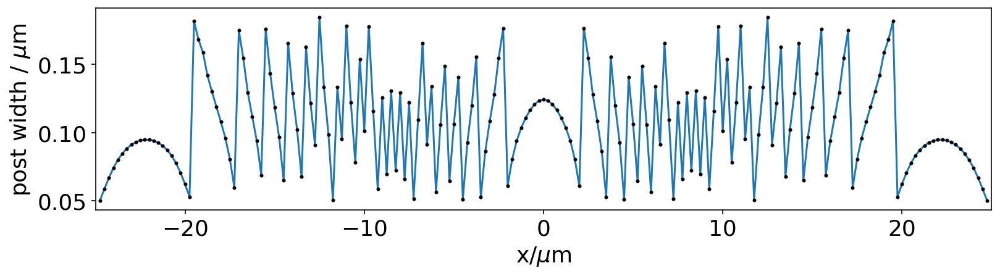

In [21]:
plot_phase_profile(metalens)

In [12]:
metalens = simulate_metalens(metalens)

-----------
Initializing structure...
     block, center = (0,-27.8,0)
          size (60,8,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.75,-23.5,0)
          size (0.05,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.5,-23.5,0)
          size (0.0585313,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.25,-23.5,0)
          size (0.0666634,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24,-23.5,0)
          size (0.0739205,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.75,-23.5,0)
          size (0.0798385,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.5,-23.5,0)
          size (0.0845032,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.25,-23.5,0)
          size (0.0882174,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23,-23.5,0)
          size (0.0909532,0.6,0)
          axes (1,0,0)

In [31]:
metalens=compute_post_simulation_params(metalens)

In [171]:
! pushover "finished"

In [32]:
list(sorted(metalens.keys()))

['H',
 'NA_c',
 'R',
 'Sx',
 'Sy',
 'TIR_onset_coordinate',
 'aperture',
 'axis_positions',
 'cell_width',
 'cmap',
 'complex_fields',
 'contour',
 'd',
 'detector_plane_coordinate',
 'detector_plane_index',
 'epsilon',
 'eta',
 'extent',
 'fcen',
 'fields',
 'gap',
 'geometry',
 'hit_the_target',
 'interface_coordinate',
 'k',
 'max_axial_field_in_image_space',
 'min_width',
 'n',
 'num of unit cells',
 'optical_axis',
 'optical_axis_index',
 'phases',
 'pml_width',
 'post_height',
 'reached_det_plane',
 'required_phases',
 'required_widths',
 'resolution',
 'rho_em',
 'run_date',
 'run_time_in_s',
 's',
 'save_output',
 'sim_cell_height',
 'sim_cell_width',
 'sim_id',
 'simulation_parameters',
 'simulation_time',
 'source_coordinate',
 'source_width',
 'substrate_height',
 'top_of_post_index',
 'top_of_posts_coordinate',
 'transverse_axis',
 'unit cell size',
 'w',
 'wavelength',
 'wavelength_rgb',
 'widths',
 'ws',
 'x_mirror_symmetry']

KeyError: 'Ez_ff_squared'

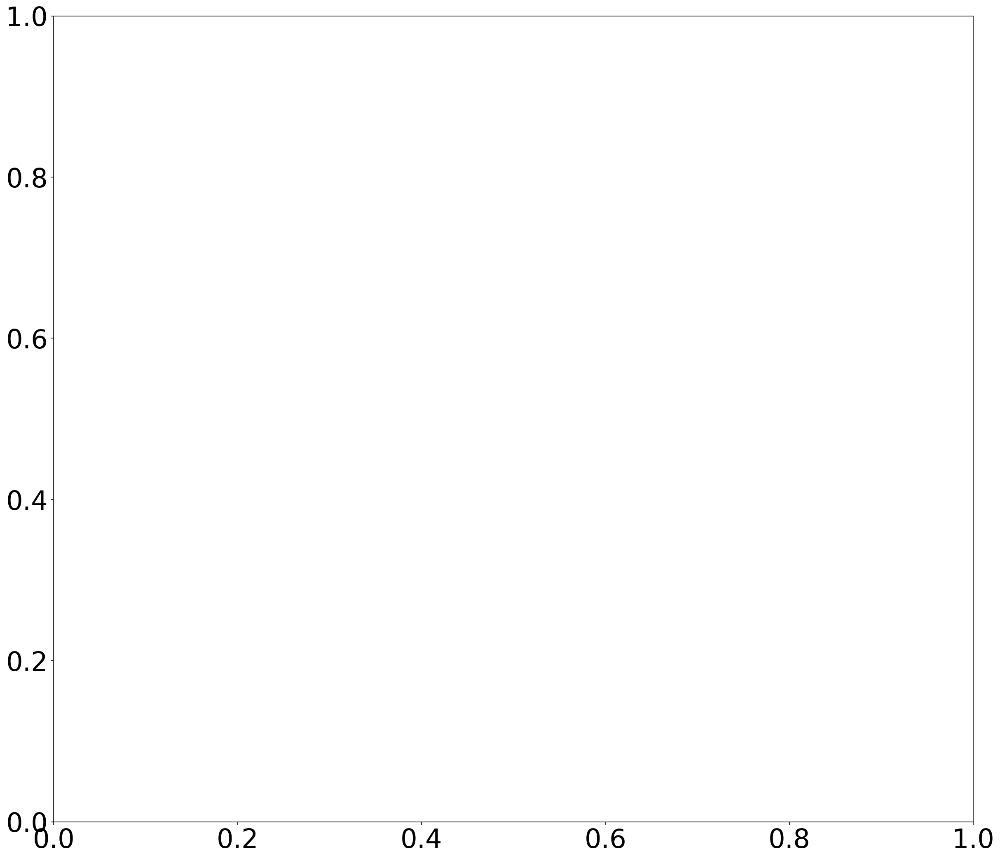

In [28]:
plot_density(metalens,
             'rho_em',
             extra='''plt.plot([-metalens["TIR_onset_coordinate"],
             metalens["TIR_onset_coordinate"]],
             [metalens["interface_coordinate"]]*2,
             "wo-")
             ''')

In [24]:
print_params(metalens)

------------------------------  -----------------------
post_height                     0.60
R                               25
d                               50.00
s                               3.00
H                               20
gap                             4
w                               5
unit cell size                  0.25
epsilon                         5.84
wavelength                      0.53
min_width                       0.05
pml_width                       1
resolution                      30.00
sim_id                          1585666549
complex_fields                  True
save_output                     False
x_mirror_symmetry               True
aperture                        50
num of unit cells               199
ws                              25
fcen                            1.88
n                               2.42
TIR_onset_coordinate            9.09
wavelength_rgb                  9.09
k                               28.55
cmap                       

# Freespace propagator

In [282]:
# metalens = pickle.load(open('/Users/juan/Google Drive/Zia Lab/Log/Data/metalens-1585259134.pkl','rb'))
metalens = pickle.load(open('/Users/juan/Google Drive/Zia Lab/Log/Data/metalens-1585257775.pkl','rb'))

In [283]:
metalens = compute_post_simulation_params(metalens)
metalens['TIR_onset_coordinate'] = np.tan(np.arcsin(1/metalens['n']))*metalens['H']

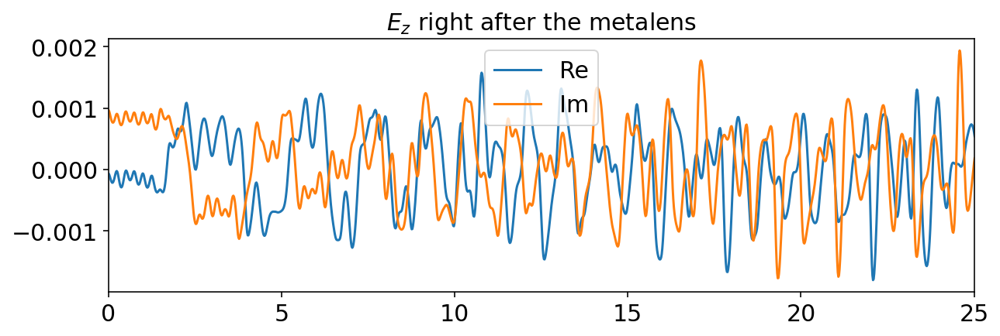

In [290]:
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(10,3))
plt.plot(metalens['transverse_axis'],
         np.real(metalens['fields']
                 ['Ez']
                 [metalens['top_of_post_index']+1]),
        label='Re')
plt.plot(metalens['transverse_axis'],
         np.imag(metalens['fields']
                 ['Ez']
                 [metalens['top_of_post_index']+1]),
        label='Im')
plt.xlim(0,metalens['R'])
plt.legend()
plt.title('$E_z$ right after the metalens',
     fontsize=15)
plt.show()

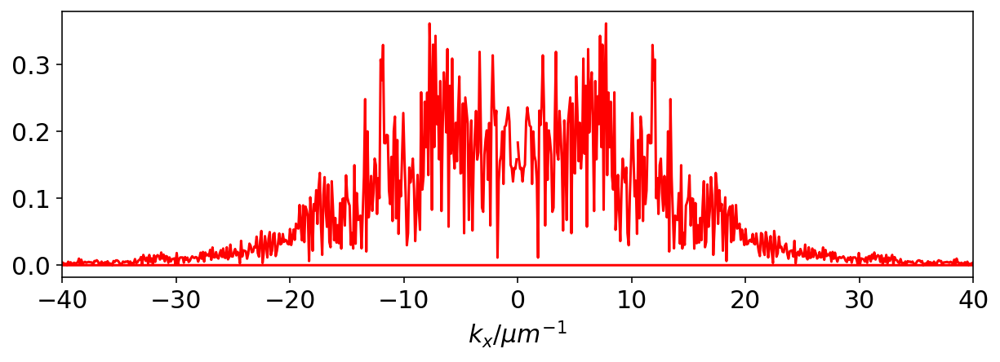

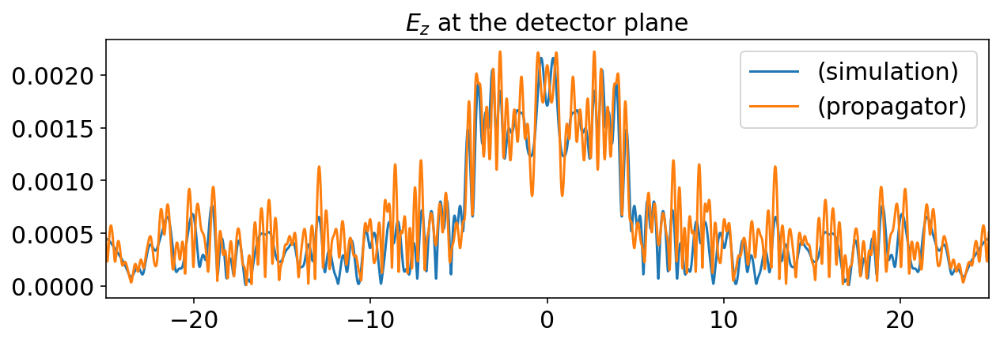

In [295]:
metalens['kx_frequencies'] = 2*np.pi*np.fft.fftfreq(metalens['fields']['Ez'].shape[1],
                                           d=1/metalens['resolution'])
metalens['near_ft_index'] = metalens['top_of_post_index']+1
metalens['near_ft_coordinate'] = (metalens['optical_axis']
                                 [metalens['near_ft_index']])
metalens['near_ft_Ez'] = np.fft.fft(metalens['fields']
                 ['Ez'][metalens['near_ft_index']])
k_sorter = np.argsort(metalens['kx_frequencies'])
metalens['k_0'] = 2*np.pi/metalens['wavelength']
metalens['ky'] = np.sqrt(metalens['k_0']**2-metalens['kx_frequencies']**2+0j)
metalens['detector_ft_Ez'] = (metalens['near_ft_Ez'] 
                              * np.exp(1j*metalens['ky']*(
                              metalens['detector_plane_coordinate']-
                              metalens['near_ft_coordinate'] ))
                             )
metalens['detector_Ez'] = np.fft.ifft(metalens['detector_ft_Ez'])

plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(10,3))
plt.plot(metalens['kx_frequencies'],
        np.abs(metalens['near_ft_Ez']),
        'r-')
plt.xlim(-40,40)
plt.xlabel('$k_x$/${\mu}m^{-1}$')
plt.show()

plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(10,3))
plt.plot(metalens['transverse_axis'],
         np.abs(metalens['fields']
                 ['Ez']
                 [metalens['detector_plane_index']]),
        label='(simulation)')
plt.plot(metalens['transverse_axis'],
         np.abs(metalens['detector_Ez']),
        label='(propagator)')
plt.xlim(-metalens['R'],metalens['R'])
plt.legend()
plt.title('$E_z$ at the detector plane',
     fontsize=15)
plt.show()

In [296]:
boost = 1
metalens['optical_axis_for_ff']=np.linspace(metalens['near_ft_coordinate'],
            metalens['detector_plane_coordinate'],
           boost*int((metalens['detector_plane_coordinate']
            -metalens['near_ft_coordinate'])*metalens['resolution']))-metalens['near_ft_coordinate']
metalens['optical_axis_for_ff']=metalens['optical_axis_for_ff'].reshape((len(metalens['optical_axis_for_ff']),1))
metalens['Ez_ft'] = (metalens['near_ft_Ez'] 
                     * np.exp(boost*1j*metalens['ky']*metalens['optical_axis_for_ff']))
metalens['Ez_ff'] = np.fft.ifft(metalens['Ez_ft'])

In [297]:
metalens['Ez_ff_squared'] = np.abs(metalens['Ez_ff'])**2

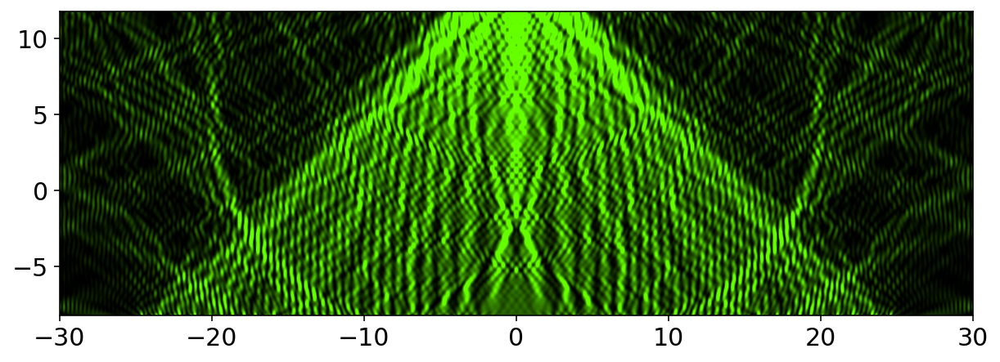

In [298]:
vmin = np.percentile(metalens['Ez_ff_squared'].flatten(),5)
vmax = np.percentile(metalens['Ez_ff_squared'].flatten(),95)
plt.figure(figsize=(10,10))
plt.imshow(metalens['Ez_ff_squared'],origin='lower',
           cmap=metalens['cmap'],
           norm=Normalize(vmin=vmin, vmax=vmax),
          extent=[-metalens['sim_cell_width']/2,
                 metalens['sim_cell_width']/2,
                 min(metalens['optical_axis_for_ff'])+metalens['near_ft_coordinate'],
                 boost*max(metalens['optical_axis_for_ff'])+metalens['near_ft_coordinate']])
plt.show()

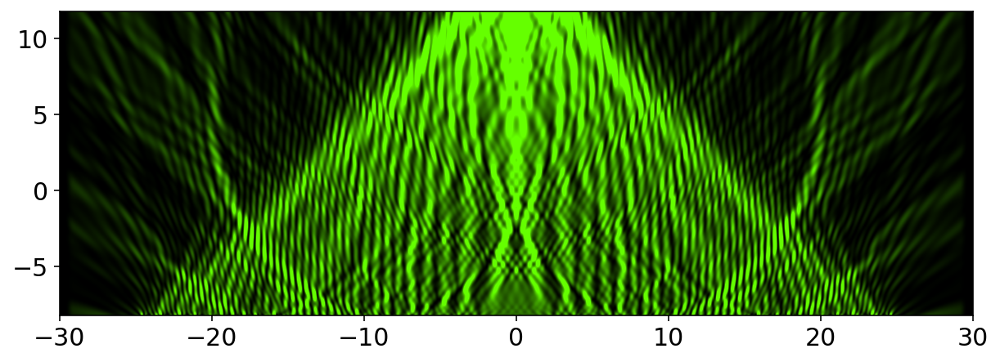

In [299]:
metalens['e2'] = np.abs(metalens['fields']['Ez'])**2
vmin = np.percentile(metalens['e2'].flatten(),5)
vmax = np.percentile(metalens['e2'].flatten(),95)
plt.figure(figsize=(10,10))
plt.imshow(metalens['e2'],origin='lower',
           cmap=metalens['cmap'],
           norm=Normalize(vmin=vmin, vmax=vmax),
          extent=metalens['extent'])
plt.ylim(min(metalens['optical_axis_for_ff'])+metalens['near_ft_coordinate'],
         max(metalens['optical_axis_for_ff'])+metalens['near_ft_coordinate'])
plt.show()

# MEEP point sources

### Ez point source

In [215]:
metasource = {'sim_cell_width': 20,
             'sim_cell_height': 20,
             'pml_width': 1,
             'wavelength': 0.532,
             'resolution': 50.}
metasource['k'] = 2*np.pi/metasource['wavelength']
metasource['simulation_time'] = metasource['sim_cell_height']/2.
metasource['extent'] = [-metasource['sim_cell_width']/2,
                       metasource['sim_cell_width']/2,
                        -metasource['sim_cell_height']/2,
                       metasource['sim_cell_height']/2,
                       ]

# Setup the MEEP objects
cell = mp.Vector3(metasource['sim_cell_width'],
                  metasource['sim_cell_height'])
# All around the simulation cell
pml_layers = [mp.PML(metasource['pml_width'])]

# Let sources be continuous
sources = [mp.Source(src=mp.ContinuousSource(
            wavelength=metasource['wavelength'],
            width = 0.),
          component=mp.Ez,
          center=mp.Vector3(0.,0.),
          size=mp.Vector3(0.,0.))]
syms = []
sim = mp.Simulation(cell_size=cell,
            boundary_layers=pml_layers,
            geometry=[],
            force_complex_fields = True,
            symmetries = syms,
            sources=sources,
            resolution=metasource['resolution'])
start_time = time.time()
metasource['run_date'] = datetime.datetime.now().strftime("%b %d %Y at %H:%M:%S")
sim.init_sim()
sim.run(until=1*metasource['simulation_time']) 

metasource['run_time_in_s'] = time.time() - start_time
metasource['fields'] = {'Ez': sim.get_array(component=mp.Ez).transpose()}
#pickle.dump(metalens, open('%smetalens-%s.pkl' % (datadir, metalens['sim_id']),'wb'))

-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 3.23/10.0 = 32.3% done in 4.0s, 8.4s to go
Meep progress: 6.18/10.0 = 61.8% done in 8.0s, 5.0s to go
Meep progress: 9.47/10.0 = 94.7% done in 12.0s, 0.7s to go
run 0 finished at t = 10.0 (1000 timesteps)


/Users/juan/opt/anaconda3/envs/pmeep/lib/python3.7/site-packages/ipykernel_launcher.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  after removing the cwd from sys.path.
/Users/juan/opt/anaconda3/envs/pmeep/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  # Remove the CWD from sys.path while we load stuff.


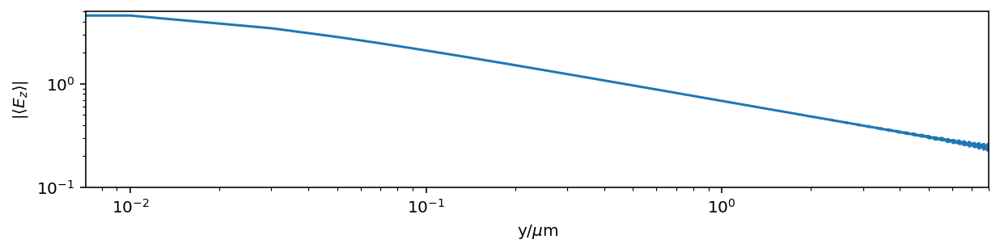

In [223]:
bits = []
for x,y in zip(np.linspace(-metasource['sim_cell_width']/2,metasource['sim_cell_width']/2,1000),
           np.sqrt((metasource['fields']['Ez']))[:,500]):
    bits.append("{%f,%f},"%(x,y))
pyperclip.copy(''.join(bits))
plt.figure(figsize=(10,2))
plt.loglog(np.linspace(-metasource['sim_cell_width']/2,metasource['sim_cell_width']/2,1000),
           (np.abs(metasource['fields']['Ez']))[:,500])
plt.ylim(0.1,5)
plt.xlim(0,8)
plt.xlabel('y/$\mu$m')
plt.ylabel('$|\langle E_z {\\rangle}|$')
plt.show()

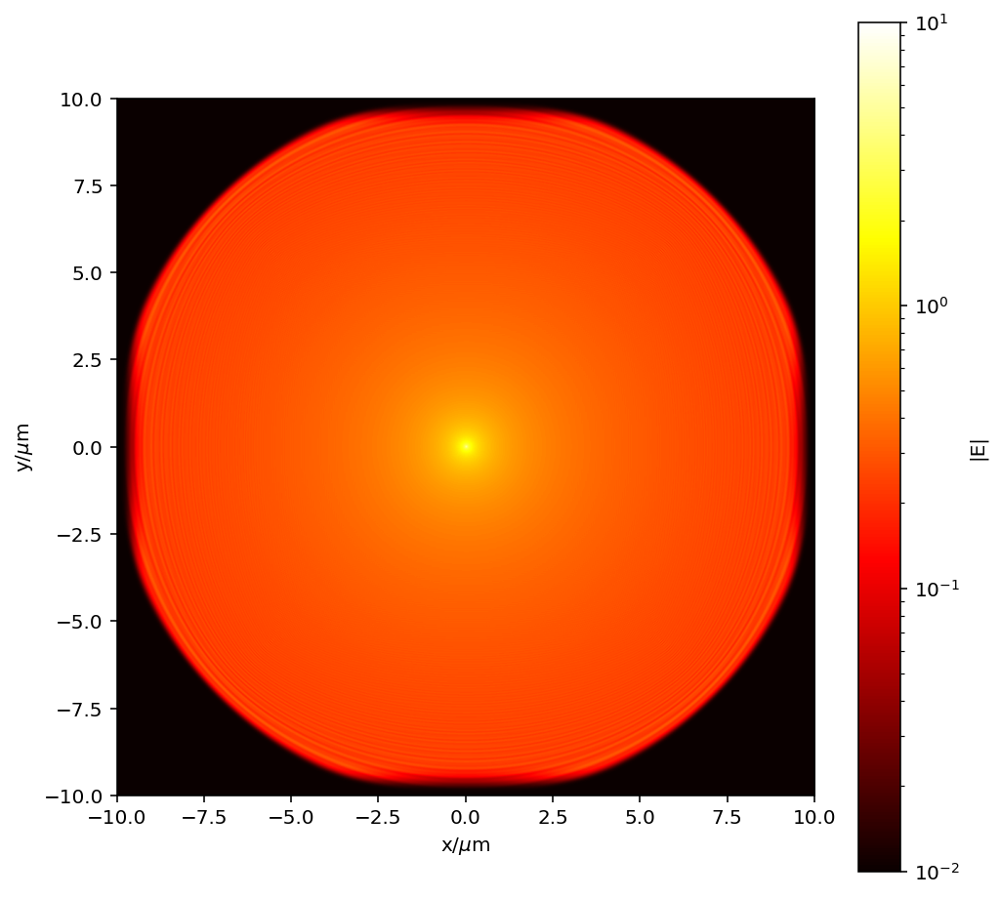

In [221]:
plt.figure(figsize=(8,8))
plt.imshow(10**(-2)+np.abs((metasource['fields']['Ez'])),
           origin='lower',
           cmap='hot',
          extent=metasource['extent'],
          norm=LogNorm(vmin=10**(-2),vmax=10))
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.colorbar(label='|E|')
plt.show()

### Ex point source

In [171]:
metasource = {'sim_cell_width': 20,
             'sim_cell_height': 20,
             'pml_width': 1,
             'wavelength': 0.532,
             'resolution': 50.}
metasource['k'] = 2*np.pi/metasource['wavelength']
metasource['simulation_time'] = metasource['sim_cell_height']/2.
metasource['extent'] = [-metasource['sim_cell_width']/2,
                       metasource['sim_cell_width']/2,
                        -metasource['sim_cell_height']/2,
                       metasource['sim_cell_height']/2,
                       ]

# Setup the MEEP objects
cell = mp.Vector3(metasource['sim_cell_width'],
                  metasource['sim_cell_height'])
# All around the simulation cell
pml_layers = [mp.PML(metasource['pml_width'])]

# Let sources be continuous
sources = [mp.Source(src=mp.ContinuousSource(
            wavelength=metasource['wavelength'],
            width = 0.),
          component=mp.Ex,
          center=mp.Vector3(0.,0.),
          size=mp.Vector3(0.,0.))]
syms = []
sim = mp.Simulation(cell_size=cell,
            boundary_layers=pml_layers,
            geometry=[],
            force_complex_fields = True,
            symmetries = syms,
            sources=sources,
            resolution=metasource['resolution'])
start_time = time.time()
metasource['run_date'] = datetime.datetime.now().strftime("%b %d %Y at %H:%M:%S")
sim.init_sim()
sim.run(until=1*metasource['simulation_time']) 

metasource['run_time_in_s'] = time.time() - start_time
metasource['fields'] = {'Ex': sim.get_array(component=mp.Ex).transpose(),
                      'Ey': sim.get_array(component=mp.Ey).transpose()}
#pickle.dump(metalens, open('%smetalens-%s.pkl' % (datadir, metalens['sim_id']),'wb'))

-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 2.58/10.0 = 25.8% done in 4.0s, 11.5s to go
Meep progress: 5.72/10.0 = 57.2% done in 8.0s, 6.0s to go
Meep progress: 8.86/10.0 = 88.6% done in 12.0s, 1.5s to go
run 0 finished at t = 10.0 (1000 timesteps)


/Users/juan/opt/anaconda3/envs/pmeep/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  # Remove the CWD from sys.path while we load stuff.


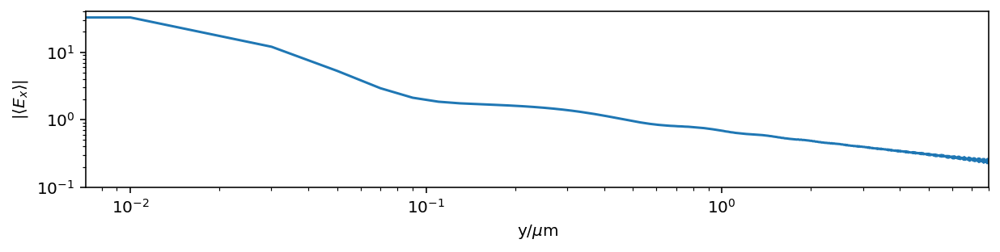

In [212]:
bits = []
for x,y in zip(np.linspace(-metasource['sim_cell_width']/2,metasource['sim_cell_width']/2,1000),
           np.sqrt(np.abs(metasource['fields']['Ex'])**2+np.abs(metasource['fields']['Ey'])**2)[:,500]):
    bits.append("{%f,%f},"%(x,y))
pyperclip.copy(''.join(bits))
plt.figure(figsize=(10,2))
plt.loglog(np.linspace(-metasource['sim_cell_width']/2,metasource['sim_cell_width']/2,1000),
           np.sqrt(np.abs(metasource['fields']['Ex'])**2+np.abs(metasource['fields']['Ey'])**2)[:,500])
plt.ylim(0.1,40)
plt.xlim(0,8)
plt.xlabel('y/$\mu$m')
plt.ylabel('$|\langle E_x {\\rangle}|$')
plt.show()

/Users/juan/opt/anaconda3/envs/pmeep/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  # This is added back by InteractiveShellApp.init_path()


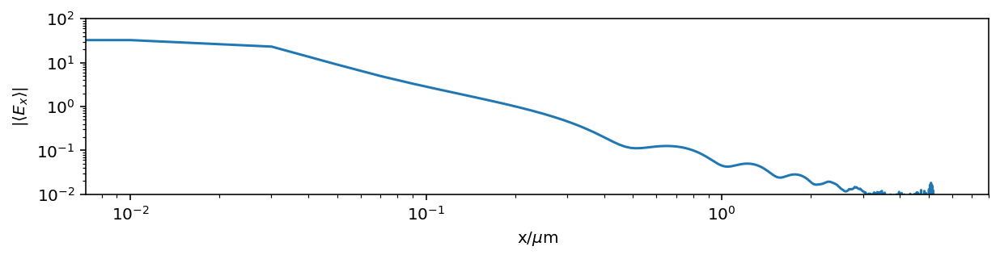

In [213]:
bits = []
for x,y in zip(np.linspace(-metasource['sim_cell_width']/2,metasource['sim_cell_width']/2,1000),
           np.sqrt(np.abs(metasource['fields']['Ex'])**2+np.abs(metasource['fields']['Ey'])**2)[500]):
    bits.append("{%f,%f},"%(x,y))
pyperclip.copy(''.join(bits))

plt.figure(figsize=(10,2))
plt.loglog(np.linspace(-metasource['sim_cell_width']/2,metasource['sim_cell_width']/2,1000),
           np.sqrt(np.abs(metasource['fields']['Ex'])**2+np.abs(metasource['fields']['Ey'])**2)[500])
plt.ylim(1e-2,100)
plt.xlim(0,8)
plt.xlabel('x/$\mu$m')
plt.ylabel('$|\langle E_x {\\rangle}|$')
plt.show()

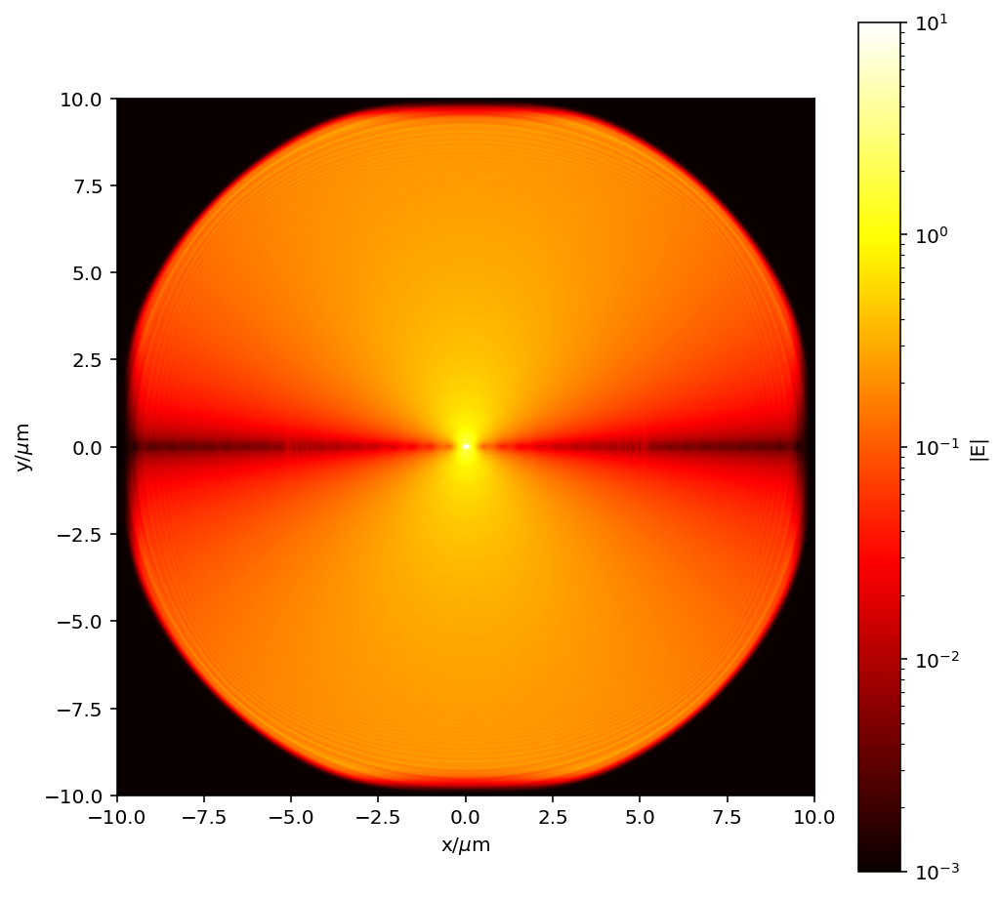

In [208]:
plt.figure(figsize=(8,8))
plt.imshow(10**(-3)+np.sqrt(np.abs(metasource['fields']['Ex'])**2+
                           np.abs(metasource['fields']['Ey'])**2),
           origin='lower',
           cmap='hot',
          extent=metasource['extent'],
          norm=LogNorm(vmin=10**(-3),vmax=10))
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.colorbar(label='|E|')
plt.show()

## Ez Point source outside of sim cell

In [539]:
metasource = {'sim_cell_width': 20,
             'sim_cell_height': 20,
             'point_source_depth': 2.0,
             'pml_width': 1,
             'wavelength': 0.532,
             'resolution': 40.,
             'gap':1}
metasource['ws'] = (metasource['sim_cell_width'] 
                    - 2*metasource['pml_width']
                    - 2*metasource['gap'])/2.
metasource['k'] = 2*np.pi/metasource['wavelength']
metasource['simulation_time'] = 3.0*np.sqrt(metasource['ws']**2+
                                       metasource['point_source_depth']**2)
metasource['extent'] = [-metasource['sim_cell_width']/2,
                       metasource['sim_cell_width']/2,
                        -metasource['sim_cell_height']/2,
                       metasource['sim_cell_height']/2,
                       ]

def far_dip_amp_fun_maker(metasource):
    def far_dip(mpvec):
        r_mag = np.sqrt(mpvec.x**2
                +metasource['point_source_depth']**2)
        the_phase = np.exp(1j*metasource['k']*r_mag)
        the_amplitude = 1./(r_mag)**1.5
        return the_phase * the_amplitude
    return far_dip
# Setup the MEEP objects
cell = mp.Vector3(metasource['sim_cell_width'],
          metasource['sim_cell_height'])
# All around the simulation cell
pml_layers = [mp.PML(metasource['pml_width'])]

# Let sources be continuous
sources = [mp.Source(src=mp.ContinuousSource(
            wavelength=metasource['wavelength'],
            width = 0.),
          component=mp.Ez,
          center=mp.Vector3(0,0),
          size=mp.Vector3(2*metasource['ws'],0),
          amp_func=far_dip_amp_fun_maker(metasource))]
syms = []
sim = mp.Simulation(cell_size=cell,
            boundary_layers=pml_layers,
            geometry=[],
            force_complex_fields = True,
            symmetries = syms,
            sources=sources,
            resolution=metasource['resolution'])
start_time = time.time()
metasource['run_date'] = datetime.datetime.now().strftime("%b %d %Y at %H:%M:%S")
sim.init_sim()
sim.run(until=1*metasource['simulation_time']) 

metasource['run_time_in_s'] = time.time() - start_time
metasource['fields'] = {'Ez': sim.get_array(component=mp.Ez).transpose(),
                      'Bx': sim.get_array(component=mp.Bx).transpose(),
                      'By': sim.get_array(component=mp.By).transpose()}
#pickle.dump(metalens, open('%smetalens-%s.pkl' % (datadir, metalens['sim_id']),'wb'))
metasource['rho_em'] = 0.5*np.abs(metasource['fields']['Ez'])**2
xlist = np.linspace(-metasource['sim_cell_width']/2,
                    metasource['sim_cell_width']/2,
                   metasource['fields']['Ez'].shape[0])

-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 7.3500000000000005/24.73863375370596 = 29.7% done in 4.0s, 9.5s to go
Meep progress: 14.5/24.73863375370596 = 58.6% done in 8.0s, 5.7s to go
Meep progress: 20.75/24.73863375370596 = 83.9% done in 12.0s, 2.3s to go
run 0 finished at t = 24.75 (1980 timesteps)


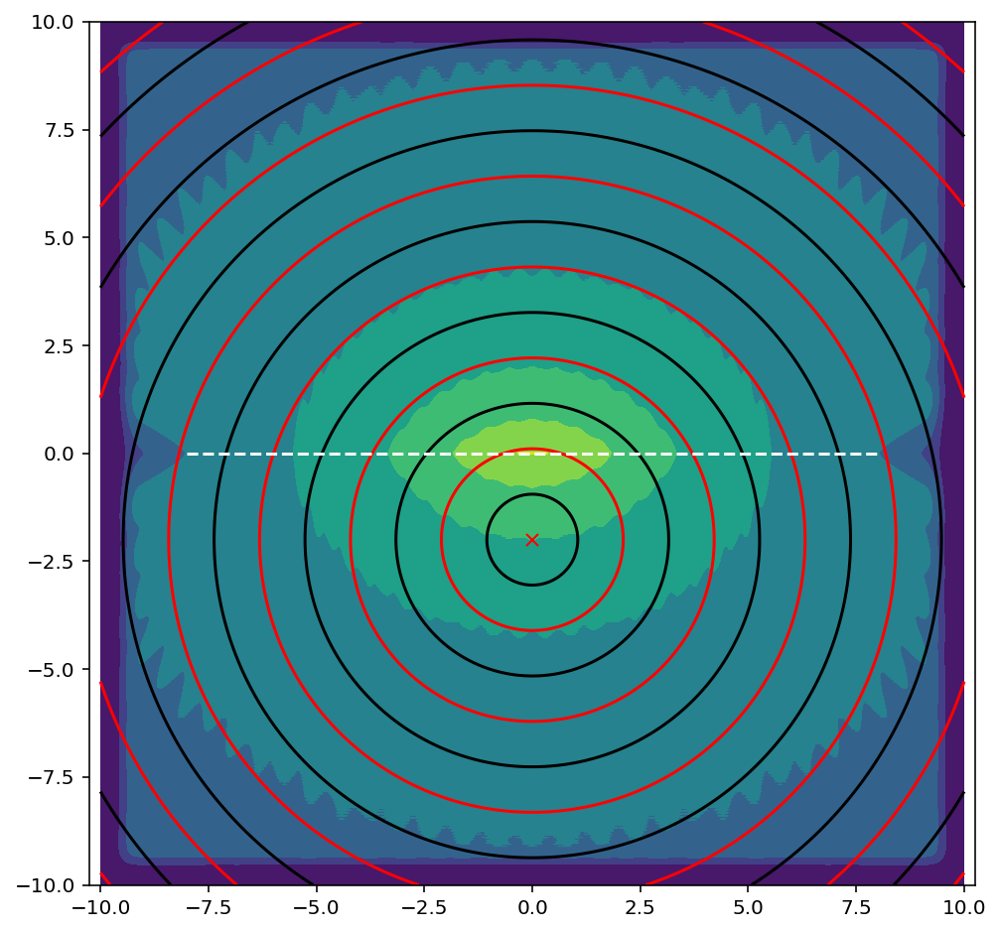

In [540]:
X, Y = np.meshgrid(xlist, xlist)
plt.figure(figsize=(8,8))
plt.contourf(X,
             Y,
             np.abs((metasource['fields']['Ez'])),
           origin='lower',
          extent=metasource['extent'])
plt.contour(X,
            Y,
            np.sqrt(X**2+(Y+metasource['point_source_depth'])**2),
            origin='lower',
            colors='r',
            levels=np.linspace(0,metasource['sim_cell_height'],20)[::2],
            extent=metasource['extent'])
plt.contour(X,
            Y,
            np.sqrt(X**2+(Y+metasource['point_source_depth'])**2),
            origin='lower',
            colors='k',
            levels=np.linspace(0,metasource['sim_cell_height'],20)[1::2],
            extent=metasource['extent'])
plt.plot([-metasource['ws'],metasource['ws']],
        [0,0],'w--')
plt.plot([0],[-metasource['point_source_depth']],'rx')
plt.axis('equal')
plt.show()

/Users/juan/opt/anaconda3/envs/pmeep/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in true_divide


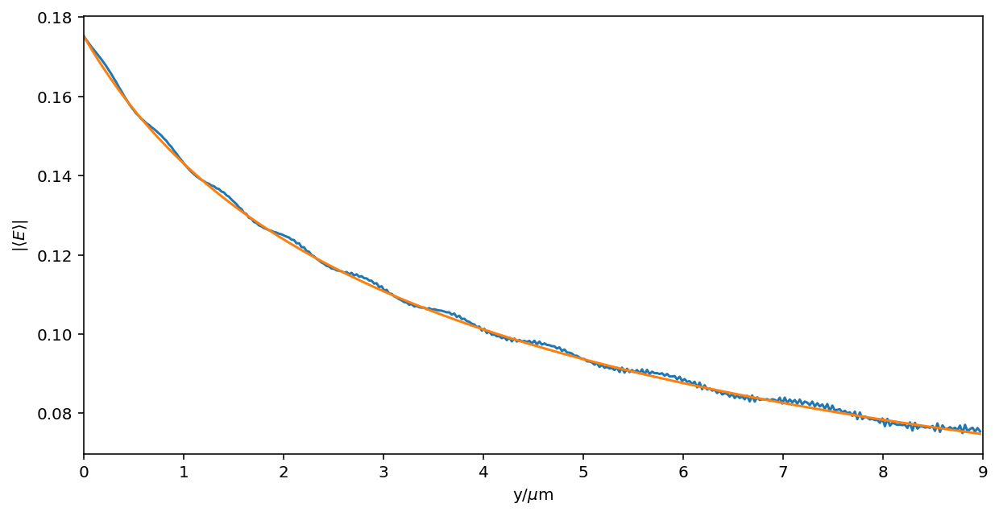

In [541]:
middle_index = int(metasource['fields']['Ez'].shape[0]/2)
exponent = 0.5
pivot_position = 1.
max_y = 9

e_mag = np.abs(metasource['fields']['Ez'])[:,middle_index][middle_index:]

y_axis = np.linspace(0,
                    metasource['sim_cell_height']/2,
                     len(e_mag))
max_y_index = np.argmin(np.abs(y_axis-max_y))
pivot_index = np.argmin(np.abs(y_axis-pivot_position))
ideal_mag = (e_mag[pivot_index]*1/
             ((y_axis+metasource['point_source_depth'])**exponent)*
             (pivot_position+metasource['point_source_depth'])**exponent)
dummy_mag = (e_mag[pivot_index]*1/
             ((y_axis)**exponent)*
             (pivot_position)**exponent)
plt.figure(figsize=(10,5))
plt.plot(y_axis[:max_y_index],
         e_mag[:max_y_index])
plt.plot(y_axis[:max_y_index],
        ideal_mag[:max_y_index])
plt.xlim(0,9)
plt.xlabel('y/$\mu$m')
plt.ylabel('|$\langle E \\rangle$|')
plt.show()

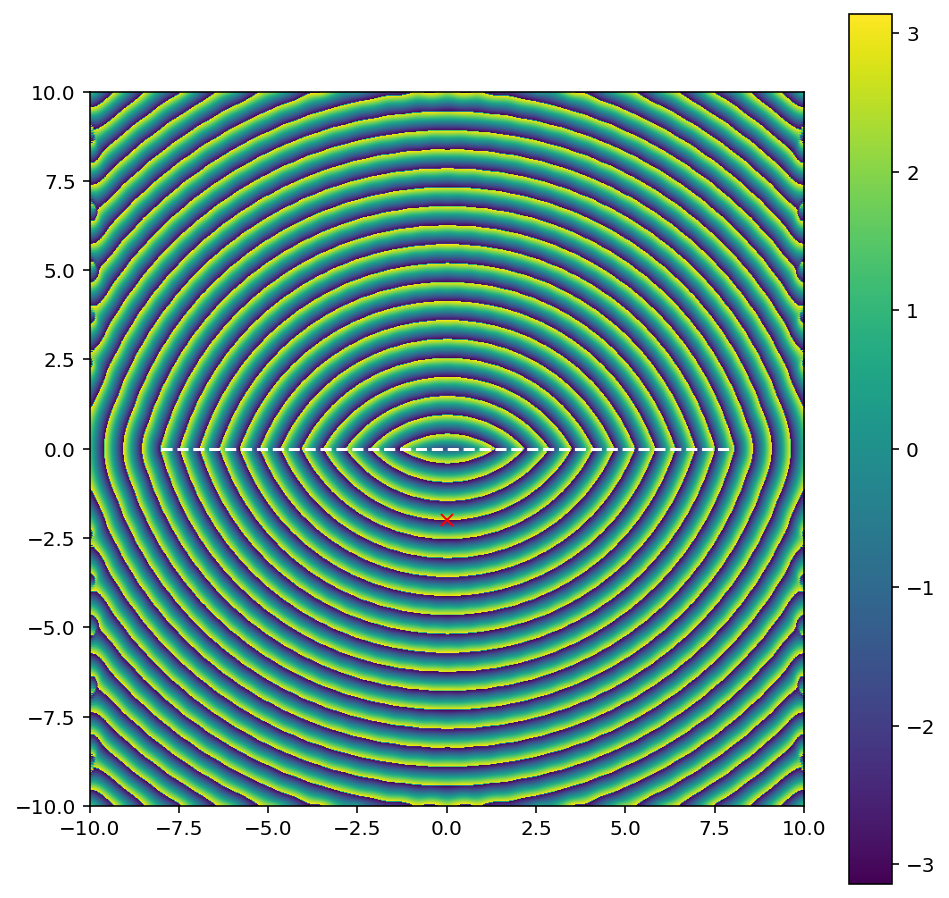

In [533]:
plt.figure(figsize=(8,8))
plt.imshow((np.angle(metasource['fields']['Ez'])),
           origin='lower',
          extent=metasource['extent'])
plt.plot([-metasource['ws'],metasource['ws']],
        [0,0],'w--')
plt.plot([0],[-metasource['point_source_depth']],'rx')
plt.colorbar()
plt.show()

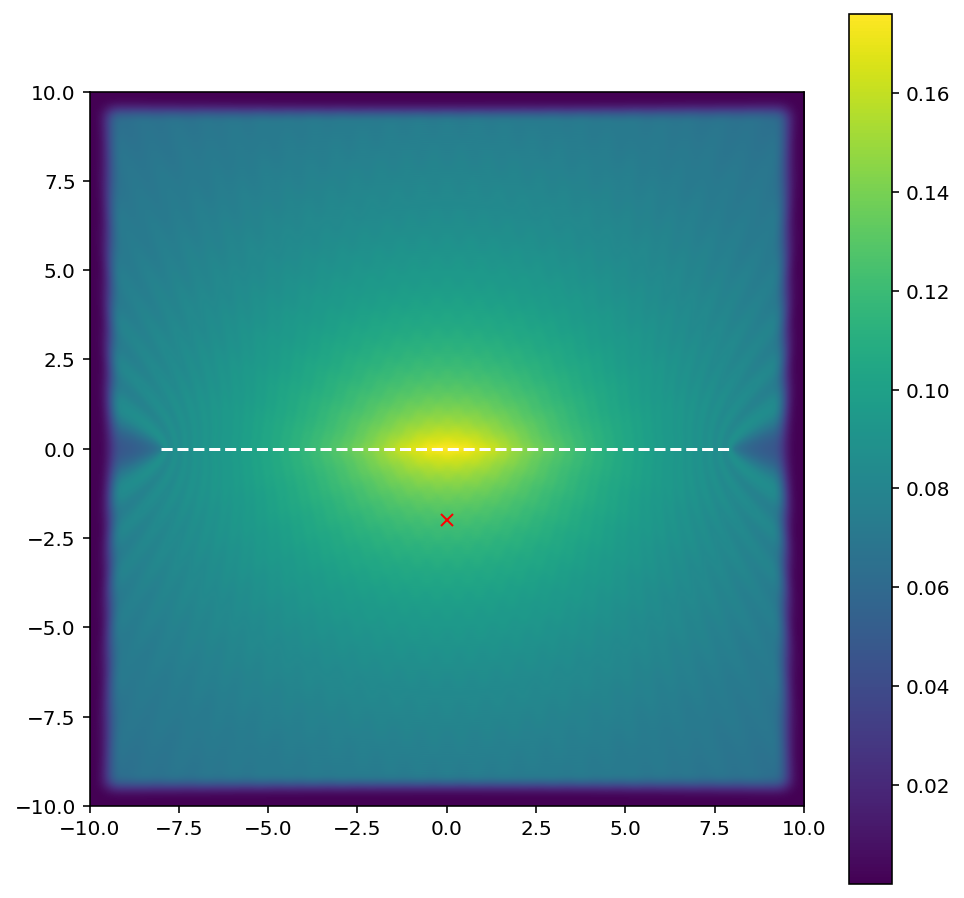

In [537]:
xlist = np.linspace(-metasource['sim_cell_width']/2,
                    metasource['sim_cell_width']/2,
                   metasource['fields']['Ez'].shape[0])
X, Y = np.meshgrid(xlist, xlist)
plt.figure(figsize=(8,8))
plt.imshow(np.abs((metasource['fields']['Ez'])),
           origin='lower',
          extent=metasource['extent'])
plt.plot([-metasource['ws'],metasource['ws']],
        [0,0],'w--')
plt.colorbar()
plt.plot([0],[-metasource['point_source_depth']],'rx')

plt.show()

In [382]:
# bits = []
# for x,y in zip(np.linspace(-metasource['sim_cell_height']/2,
#                     metasource['sim_cell_height']/2,1000)[500:],
#          np.abs((metasource['fields']['Ez']))[:,500][500:]):
#     bits.append("{%f,%f},"%(x,y))
# pyperclip.copy(''.join(bits))

# Finite Conjugate H=20 um, d=50um, R=25, w=5, 250 nm pitch

### S4 - bootstrap

In [160]:
simulation_parameters = {
                        'wavelength': 0.532,
                        'post_width': 0.075,
                        'post_height': 0.600,
                        'cell_width': 0.25,
                        'epsilon': 5.8418,
                        'num_G' : 70,
                        'x_coord': 0,
                        'y_coord': 0,
                        'sim_id' : str(int(time.time())),
                        's_amp': 0, 'p_amp': 1,
                        'finite_conjugate': True}
simulation_parameters = expand_sim_params(simulation_parameters)

In [161]:
results = post_phase(simulation_parameters)

In [162]:
post_widths = np.linspace(0.05,0.2,20)
phases = []
simulation_parameters['field_height'] = simulation_parameters['post_height']
for p_width in post_widths:
    simulation_parameters['post_width'] = p_width
    simulation_parameters = expand_sim_params(simulation_parameters)
    results = post_phase(simulation_parameters)
    Exr = results[0]
    Eyr = results[1]
    Ezr = results[2]
    Exi = results[3]
    Eyi = results[4]
    Ezi = results[5] 
    phases.append(np.arctan2(Exi, Exr))
phases = np.array(phases)
phases = np.unwrap(phases)
phases = phases - phases[0]
critical_width = np.interp(2*np.pi*1.01,phases,post_widths)
print(critical_width)

0.19421068187715892


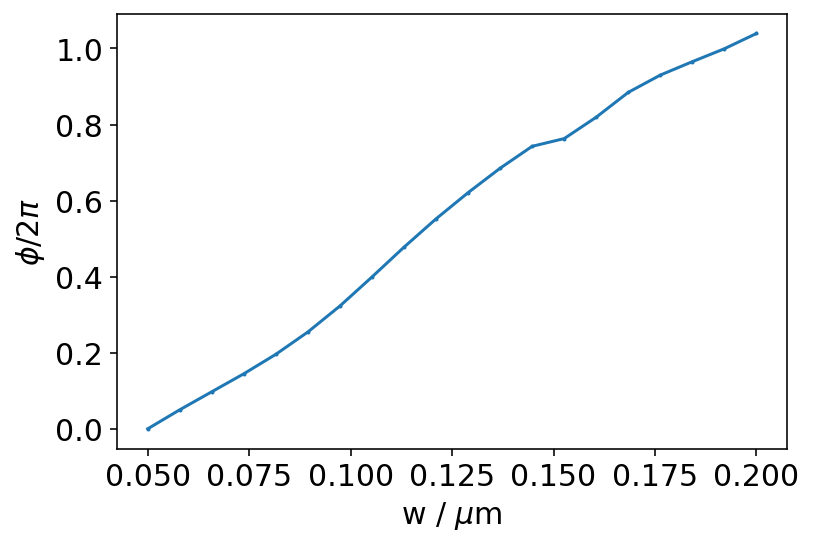

In [163]:
plt.rcParams.update({'font.size': 15})
plt.figure()
plt.plot(post_widths,phases / (2*np.pi),'o-',ms=1.)
plt.xlabel('w / $\mu$m')
plt.ylabel('$\phi/2\pi$')
plt.show()

In [164]:
print(simulation_parameters['sim_id'])
pickle.dump({'post_widths':post_widths,'phases': phases, 'simulation_parameters': simulation_parameters},
            open('carbon-phases-%s.pkl' % simulation_parameters['sim_id'],'wb'))

1585259134


### MEEP - run

In [165]:
sim_fname =  '/Users/juan/Google Drive/Zia Lab/CEM/MEEP/carbon-phases-%s.pkl' % simulation_parameters['sim_id']
post_widths = pickle.load(open(sim_fname,'rb'))['post_widths']
phases = pickle.load(open(sim_fname,'rb'))['phases']
simulation_parameters = pickle.load(open(sim_fname,'rb'))['simulation_parameters']

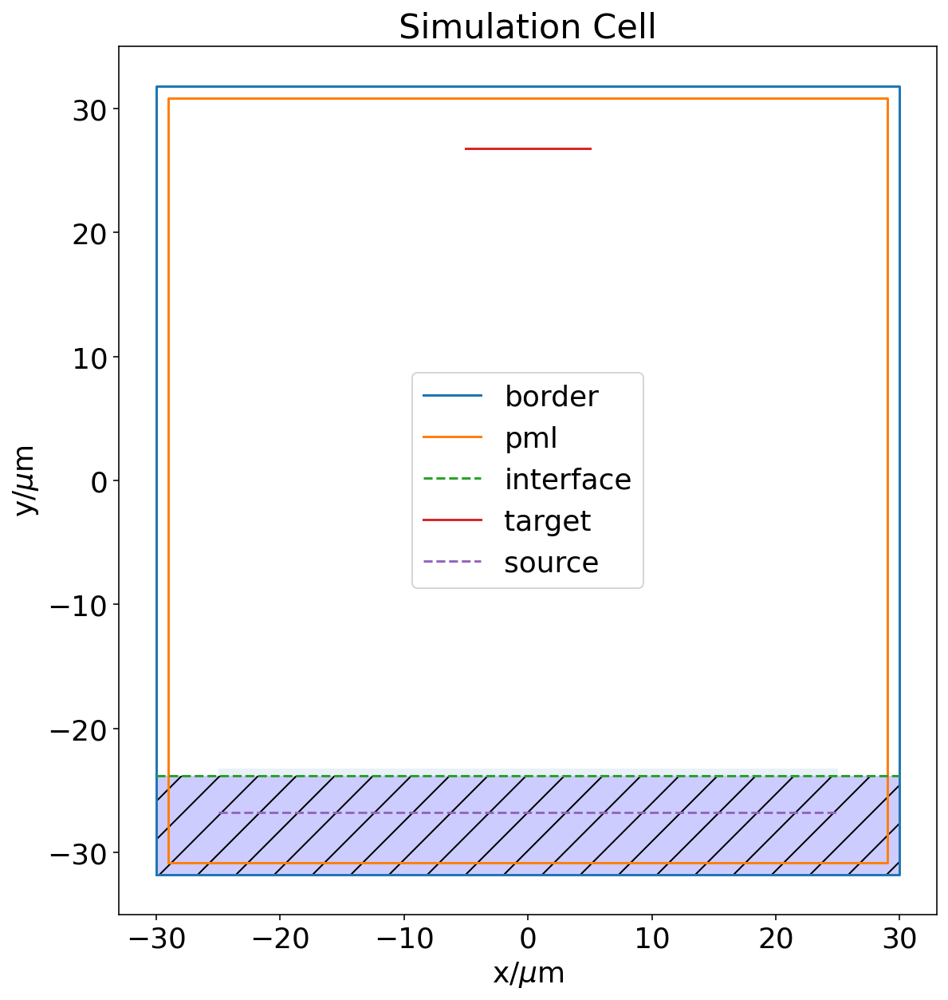

In [166]:
metalens = {
    'post_height':simulation_parameters['post_height'],
    'R': 25,
    'd': 50.,
    's': 3.,
    'H': 20,
    'gap': 4,
    'w': 5,
    'unit cell size': simulation_parameters['cell_width'],
    'epsilon': simulation_parameters['epsilon'],
    'phases': phases,
    'widths': post_widths,
    'wavelength': simulation_parameters['wavelength'],
    'min_width': 0.05,
    'pml_width': 1,
    'resolution': 60.,
    'sim_id': simulation_parameters['sim_id'],
    'simulation_parameters' : simulation_parameters,
    'complex_fields' : True,
    'save_output': False,
    'x_mirror_symmetry': True}
metalens = aux_params(metalens)
plot_simulation_cell(metalens)

In [167]:
metalens = make_metalens_geometry(metalens)

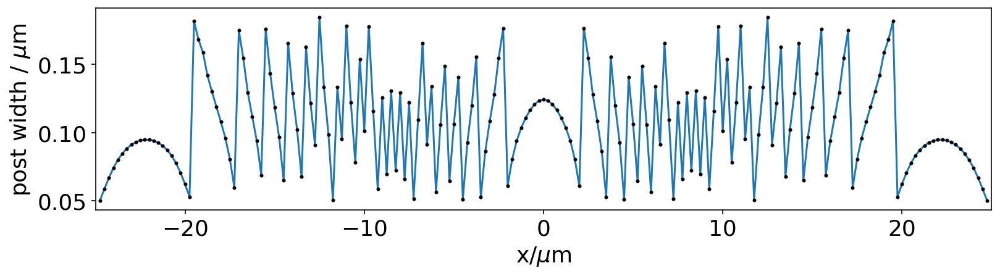

In [168]:
plot_phase_profile(metalens)

In [169]:
metalens = simulate_metalens(metalens)

-----------
Initializing structure...
     block, center = (0,-27.8,0)
          size (60,8,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.75,-23.5,0)
          size (0.05,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.5,-23.5,0)
          size (0.0585313,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.25,-23.5,0)
          size (0.0666634,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24,-23.5,0)
          size (0.0739205,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.75,-23.5,0)
          size (0.0798385,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.5,-23.5,0)
          size (0.0845032,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.25,-23.5,0)
          size (0.0882174,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23,-23.5,0)
          size (0.0909532,0.6,0)
          axes (1,0,0)

Meep progress: 38.391666666666666/119.771977826172 = 32.1% done in 347.1s, 735.7s to go
Meep progress: 38.833333333333336/119.771977826172 = 32.4% done in 351.1s, 731.8s to go
Meep progress: 39.275/119.771977826172 = 32.8% done in 355.1s, 727.9s to go
Meep progress: 39.71666666666667/119.771977826172 = 33.2% done in 359.2s, 724.0s to go
Meep progress: 40.15833333333333/119.771977826172 = 33.5% done in 363.2s, 720.1s to go
Meep progress: 40.6/119.771977826172 = 33.9% done in 367.3s, 716.2s to go
Meep progress: 41.041666666666664/119.771977826172 = 34.3% done in 371.3s, 712.3s to go
Meep progress: 41.483333333333334/119.771977826172 = 34.6% done in 375.4s, 708.5s to go
Meep progress: 41.88333333333333/119.771977826172 = 35.0% done in 379.4s, 705.6s to go
Meep progress: 42.325/119.771977826172 = 35.3% done in 383.5s, 701.7s to go
Meep progress: 42.766666666666666/119.771977826172 = 35.7% done in 387.5s, 697.8s to go
Meep progress: 43.208333333333336/119.771977826172 = 36.1% done in 391.6s

Meep progress: 82.35833333333333/119.771977826172 = 68.8% done in 742.9s, 337.5s to go
Meep progress: 82.83333333333333/119.771977826172 = 69.2% done in 747.0s, 333.1s to go
Meep progress: 83.3/119.771977826172 = 69.5% done in 751.0s, 328.8s to go
Meep progress: 83.75/119.771977826172 = 69.9% done in 755.1s, 324.8s to go
Meep progress: 84.19166666666666/119.771977826172 = 70.3% done in 759.1s, 320.8s to go
Meep progress: 84.66666666666667/119.771977826172 = 70.7% done in 763.2s, 316.5s to go
Meep progress: 85.13333333333333/119.771977826172 = 71.1% done in 767.3s, 312.2s to go
Meep progress: 85.6/119.771977826172 = 71.5% done in 771.3s, 307.9s to go
Meep progress: 86.06666666666666/119.771977826172 = 71.9% done in 775.3s, 303.6s to go
Meep progress: 86.53333333333333/119.771977826172 = 72.2% done in 779.3s, 299.4s to go
Meep progress: 86.99166666666666/119.771977826172 = 72.6% done in 783.4s, 295.2s to go
Meep progress: 87.45/119.771977826172 = 73.0% done in 787.4s, 291.0s to go
Meep p

In [170]:
metalens=compute_post_simulation_params(metalens)

In [171]:
! pushover "finished"

In [181]:
metalens['TIR_onset_coordinate'] = np.tan(np.arcsin(1/metalens['n']))*metalens['H']

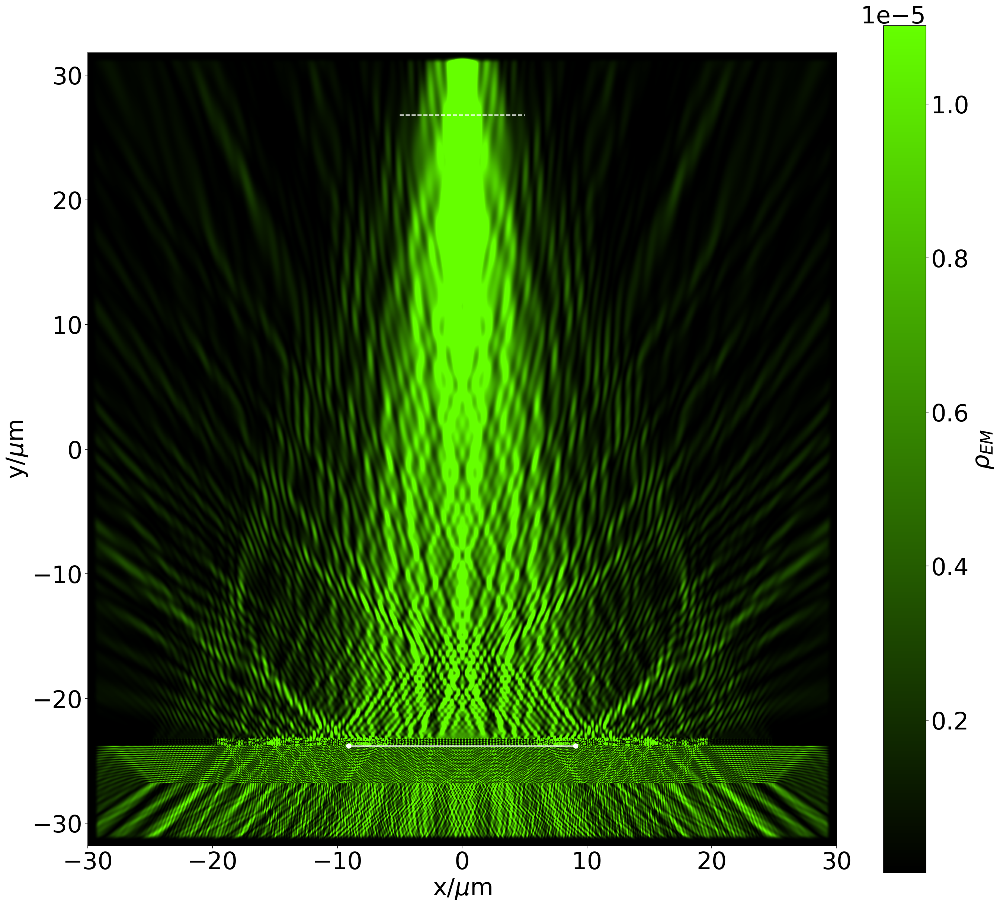

In [188]:
plot_density(metalens,
             'rho_em',
             extra='''plt.plot([-metalens["TIR_onset_coordinate"],
             metalens["TIR_onset_coordinate"]],
             [metalens["interface_coordinate"]]*2,
             "wo-")
             ''')

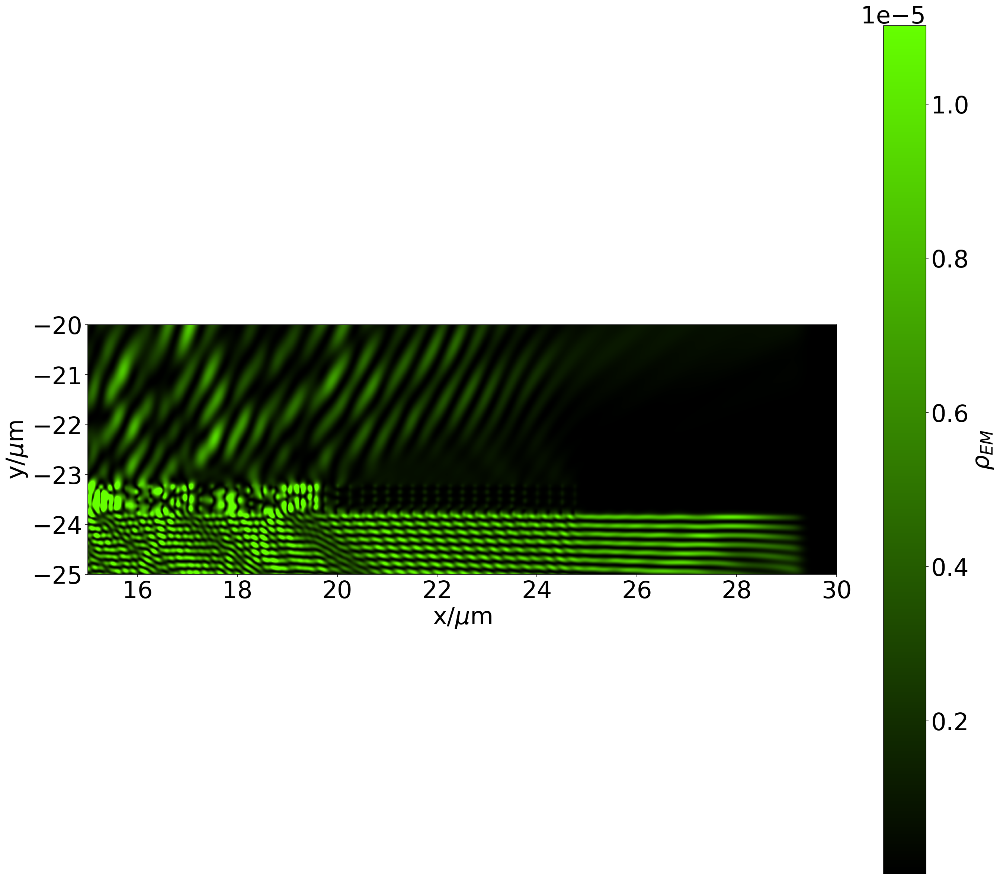

In [194]:
plot_density(metalens,
             'rho_em',
             extra='''plt.plot([-metalens["TIR_onset_coordinate"],
             metalens["TIR_onset_coordinate"]],
             [metalens["interface_coordinate"]]*2,
             "wo-"); plt.xlim(15,30); plt.ylim(-25,-20)
             ''')

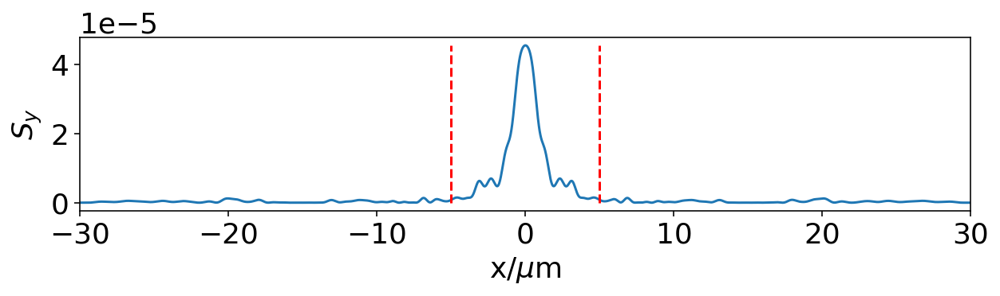

In [195]:
plt.rcParams.update({'font.size': 18})
plt.figure(figsize=(10,2))
plt.plot(metalens['transverse_axis'],metalens['Sy'][metalens['detector_plane_index']])
#plt.plot(metalens['transverse_axis'],metalens['e2'][metalens['max_axial_field_in_image_space']])
plt.plot([-metalens['w']]*2,[0,max(metalens['Sy'][metalens['detector_plane_index']])],'r--')
plt.plot([metalens['w']]*2,[0,max(metalens['Sy'][metalens['detector_plane_index']])],'r--')
plt.xlabel('x/$\mu$m')
plt.ylabel('$S_y$')
plt.xlim(-metalens['sim_cell_width']/2,
        metalens['sim_cell_width']/2)
plt.savefig('metalens-{sim_id}-top-cross-section.pdf'.format(**metalens),
           transparent=True)
plt.show()

In [174]:
print_params(metalens)

------------------------------  -----------------------
post_height                     0.60
R                               25
d                               50.00
s                               3.00
H                               20
gap                             4
w                               5
unit cell size                  0.25
epsilon                         5.84
wavelength                      0.53
min_width                       0.05
pml_width                       1
resolution                      60.00
sim_id                          1585259134
complex_fields                  True
save_output                     False
x_mirror_symmetry               True
aperture                        50
num of unit cells               199
ws                              25
fcen                            1.88
n                               2.42
wavelength_rgb                  2.42
k                               28.55
cmap                            28.55
sim_cell_width            

In [205]:
required_phases = np.array([imaging_phase_profile(**metalens, x=xs) 
                                for xs in metalens['axis_positions']])
#required_phases = required_phases - min(required_phases)
# required_phases = required_phases % (2*np.pi)

In [208]:
int(min(required_phases)/2/np.pi)

-62

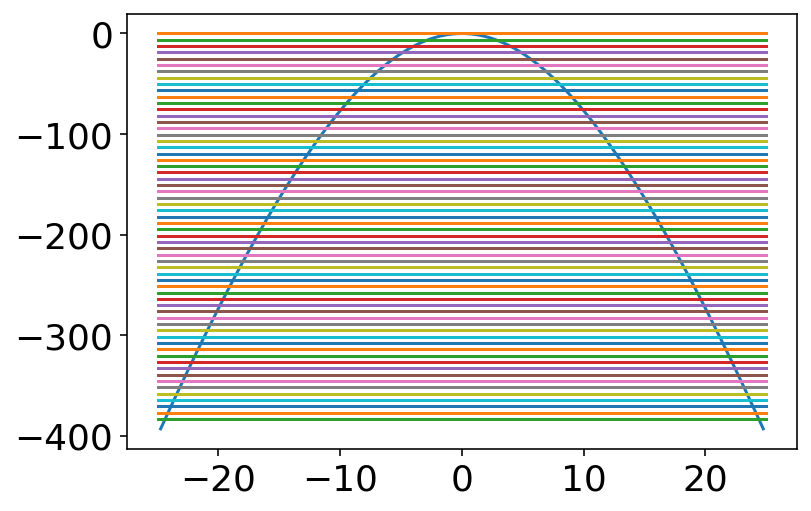

In [209]:
plt.figure()
plt.plot(metalens['axis_positions'],
        required_phases)
for i in range(-int(min(required_phases)/2/np.pi)):
    plt.plot([-metalens['R'],metalens['R']],
            [-i*2*np.pi]*2)
plt.show()

# Finite Conjugate H=50 um, d=20um, R=25, w=5, 250 nm pitch

### S4 - bootstrap

In [132]:
simulation_parameters = {
                        'wavelength': 0.532,
                        'post_width': 0.075,
                        'post_height': 0.600,
                        'cell_width': 0.25,
                        'epsilon': 5.8418,
                        'num_G' : 70,
                        'x_coord': 0,
                        'y_coord': 0,
                        'sim_id' : str(int(time.time())),
                        's_amp': 0, 'p_amp': 1,
                        'finite_conjugate': True}
simulation_parameters = expand_sim_params(simulation_parameters)

In [133]:
results = post_phase(simulation_parameters)

In [134]:
post_widths = np.linspace(0.05,0.2,20)
phases = []
simulation_parameters['field_height'] = simulation_parameters['post_height']
for p_width in post_widths:
    simulation_parameters['post_width'] = p_width
    simulation_parameters = expand_sim_params(simulation_parameters)
    results = post_phase(simulation_parameters)
    Exr = results[0]
    Eyr = results[1]
    Ezr = results[2]
    Exi = results[3]
    Eyi = results[4]
    Ezi = results[5] 
    phases.append(np.arctan2(Exi, Exr))
phases = np.array(phases)
phases = np.unwrap(phases)
phases = phases - phases[0]
critical_width = np.interp(2*np.pi*1.01,phases,post_widths)
print(critical_width)

0.19421068187715892


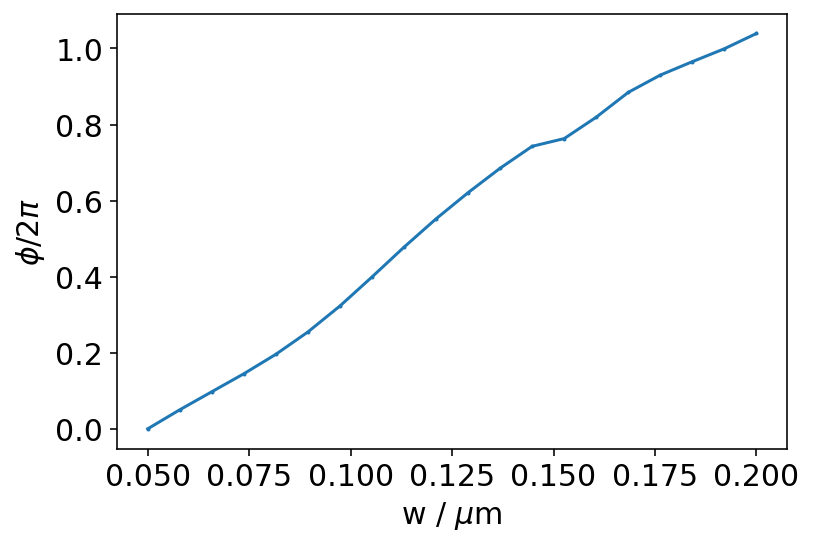

In [135]:
plt.rcParams.update({'font.size': 15})
plt.figure()
plt.plot(post_widths,phases / (2*np.pi),'o-',ms=1.)
plt.xlabel('w / $\mu$m')
plt.ylabel('$\phi/2\pi$')
plt.show()

In [136]:
print(simulation_parameters['sim_id'])
pickle.dump({'post_widths':post_widths,'phases': phases, 'simulation_parameters': simulation_parameters},
            open('carbon-phases-%s.pkl' % simulation_parameters['sim_id'],'wb'))

1585257775


### MEEP - run

In [137]:
sim_fname =  '/Users/juan/Google Drive/Zia Lab/CEM/MEEP/carbon-phases-%s.pkl' % '1585257775'
post_widths = pickle.load(open(sim_fname,'rb'))['post_widths']
phases = pickle.load(open(sim_fname,'rb'))['phases']
simulation_parameters = pickle.load(open(sim_fname,'rb'))['simulation_parameters']

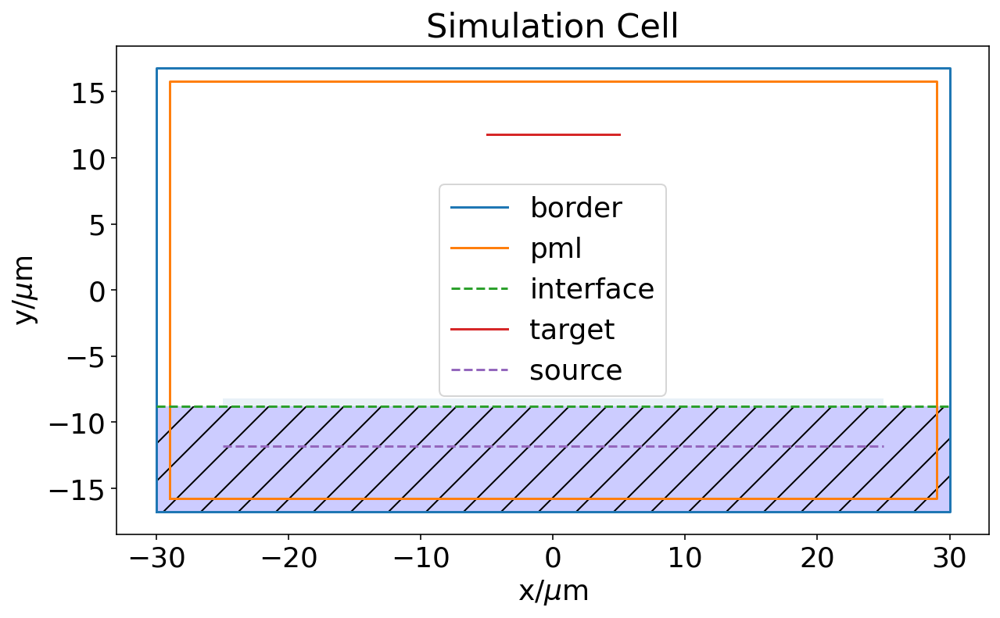

In [151]:
metalens = {
    'post_height':simulation_parameters['post_height'],
    'R': 25,
    'd': 20.,
    's': 3.,
    'H': 50,
    'gap': 4,
    'w': 5,
    'unit cell size': simulation_parameters['cell_width'],
    'epsilon': simulation_parameters['epsilon'],
    'phases': phases,
    'widths': post_widths,
    'wavelength': simulation_parameters['wavelength'],
    'min_width': 0.05,
    'pml_width': 1,
    'resolution': 60.,
    'sim_id': simulation_parameters['sim_id'],
    'simulation_parameters' : simulation_parameters,
    'complex_fields' : True,
    'save_output': False,
    'x_mirror_symmetry': True}
metalens = aux_params(metalens)
plot_simulation_cell(metalens)

In [152]:
metalens = make_metalens_geometry(metalens)

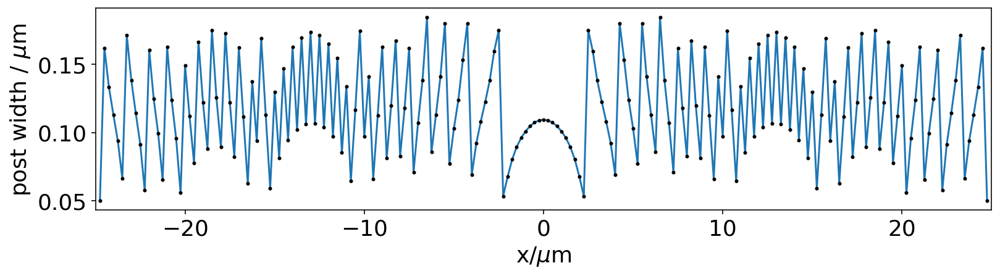

In [153]:
plot_phase_profile(metalens)

In [154]:
metalens = simulate_metalens(metalens)

-----------
Initializing structure...
     block, center = (0,-12.8,0)
          size (60,8,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.75,-8.5,0)
          size (0.05,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.5,-8.5,0)
          size (0.162002,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.25,-8.5,0)
          size (0.133422,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24,-8.5,0)
          size (0.113117,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.75,-8.5,0)
          size (0.0936946,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.5,-8.5,0)
          size (0.0660765,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.25,-8.5,0)
          size (0.171289,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23,-8.5,0)
          size (0.138465,0.6,0)
          axes (1,0,0), (0,1,0), (0

Meep progress: 70.56666666666666/74.8733344984831 = 94.2% done in 345.8s, 21.1s to go
Meep progress: 71.45/74.8733344984831 = 95.4% done in 349.8s, 16.8s to go
Meep progress: 72.325/74.8733344984831 = 96.6% done in 353.9s, 12.5s to go
Meep progress: 73.18333333333334/74.8733344984831 = 97.7% done in 357.9s, 8.3s to go
Meep progress: 74.025/74.8733344984831 = 98.9% done in 361.9s, 4.1s to go
Meep progress: 74.875/74.8733344984831 = 100.0% done in 365.9s, -0.0s to go
run 0 finished at t = 74.875 (8985 timesteps)


In [155]:
metalens=compute_post_simulation_params(metalens)

In [156]:
! pushover "finished"

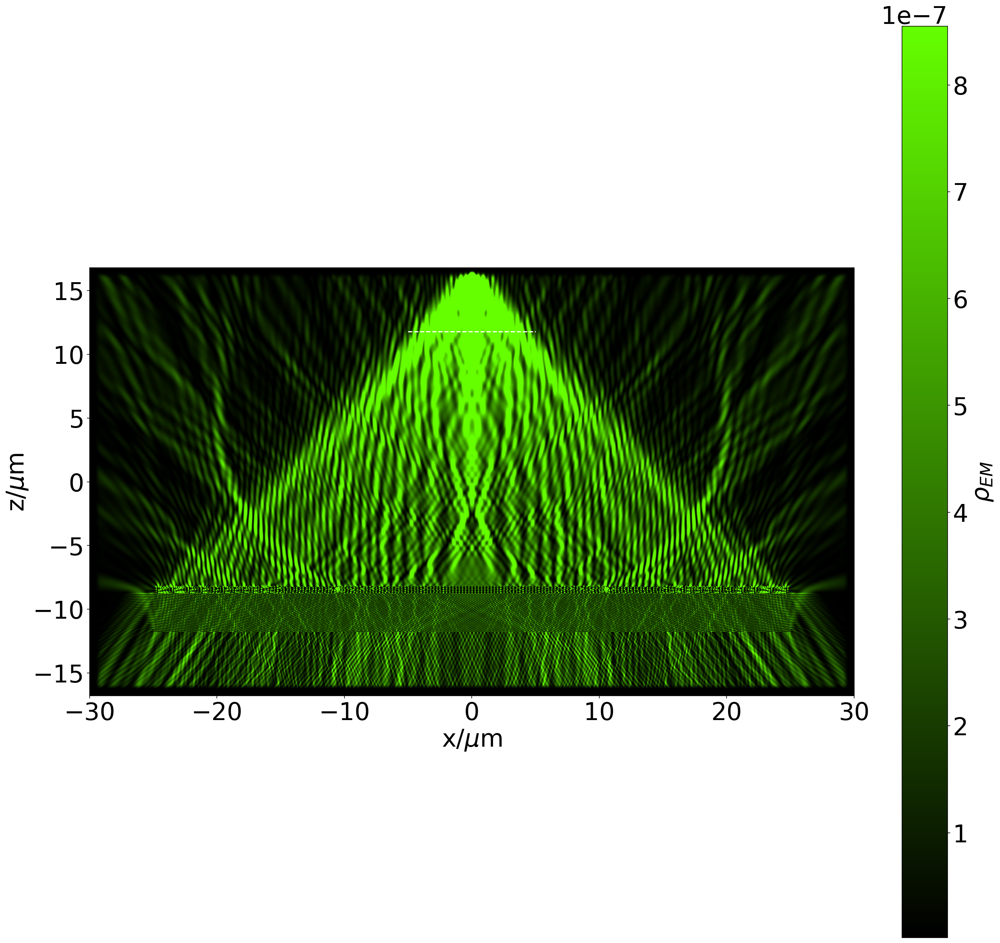

In [157]:
plot_density(metalens, 'rho_em')

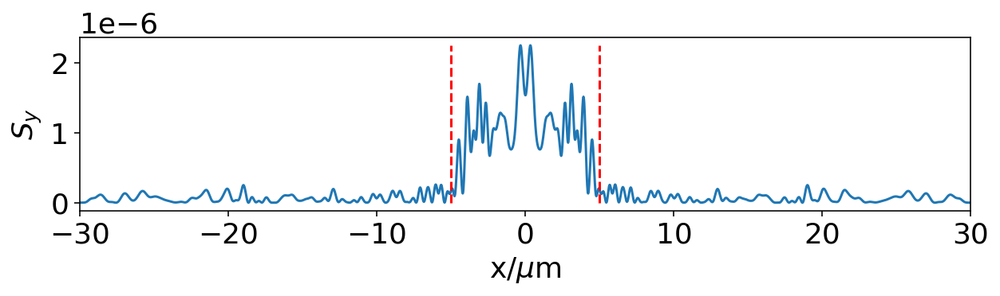

In [158]:
plt.rcParams.update({'font.size': 18})
plt.figure(figsize=(10,2))
plt.plot(metalens['transverse_axis'],metalens['Sy'][metalens['detector_plane_index']])
#plt.plot(metalens['transverse_axis'],metalens['e2'][metalens['max_axial_field_in_image_space']])
plt.plot([-metalens['w']]*2,[0,max(metalens['Sy'][metalens['detector_plane_index']])],'r--')
plt.plot([metalens['w']]*2,[0,max(metalens['Sy'][metalens['detector_plane_index']])],'r--')
plt.xlabel('x/$\mu$m')
plt.ylabel('$S_y$')
plt.xlim(-metalens['sim_cell_width']/2,
        metalens['sim_cell_width']/2)
plt.savefig('metalens-{sim_id}-top-cross-section.pdf'.format(**metalens),
           transparent=True)
plt.show()

In [159]:
print_params(metalens)

------------------------------  -----------------------
post_height                     0.60
R                               25
d                               20.00
s                               3.00
H                               50
gap                             4
w                               5
unit cell size                  0.25
epsilon                         5.84
wavelength                      0.53
min_width                       0.05
pml_width                       1
resolution                      60.00
sim_id                          1585257775
complex_fields                  True
save_output                     False
x_mirror_symmetry               True
aperture                        50
num of unit cells               199
ws                              25
fcen                            1.88
n                               2.42
wavelength_rgb                  2.42
k                               28.55
cmap                            28.55
sim_cell_width            

# Finite Conjugate H=d=50 um, R=25, w=5, 250 nm pitch

### S4 - bootstrap

In [4]:
simulation_parameters = {
                        'wavelength': 0.532,
                        'post_width': 0.075,
                        'post_height': 0.600,
                        'cell_width': 0.25,
                        'epsilon': 5.8418,
                        'num_G' : 70,
                        'x_coord': 0,
                        'y_coord': 0,
                        'sim_id' : str(int(time.time())),
                        's_amp': 0, 'p_amp': 1,
                        'finite_conjugate': True}
simulation_parameters = expand_sim_params(simulation_parameters)

In [5]:
results = post_phase(simulation_parameters)

In [6]:
post_widths = np.linspace(0.05,0.2,20)
phases = []
simulation_parameters['field_height'] = simulation_parameters['post_height']
for p_width in post_widths:
    simulation_parameters['post_width'] = p_width
    simulation_parameters = expand_sim_params(simulation_parameters)
    results = post_phase(simulation_parameters)
    Exr = results[0]
    Eyr = results[1]
    Ezr = results[2]
    Exi = results[3]
    Eyi = results[4]
    Ezi = results[5] 
    phases.append(np.arctan2(Exi, Exr))
phases = np.array(phases)
phases = np.unwrap(phases)
phases = phases - phases[0]
critical_width = np.interp(2*np.pi*1.01,phases,post_widths)
print(critical_width)

0.19421068187715892


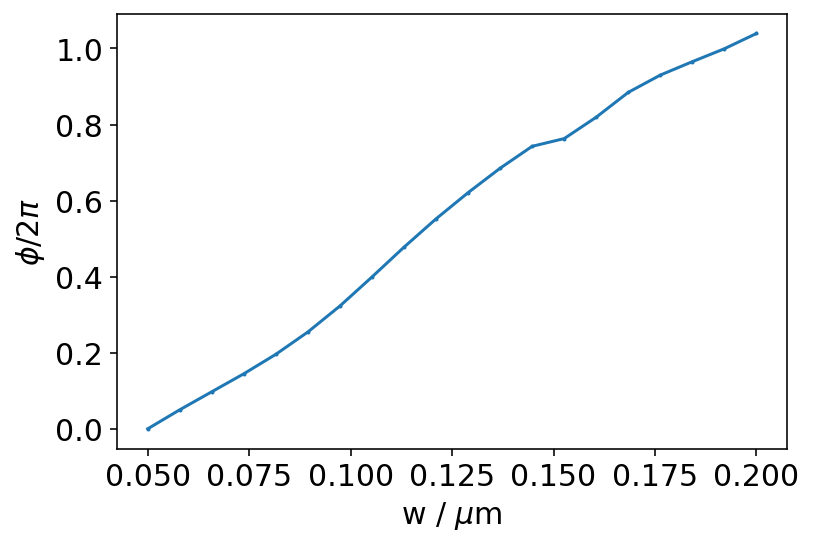

In [7]:
plt.rcParams.update({'font.size': 15})
plt.figure()
plt.plot(post_widths,phases / (2*np.pi),'o-',ms=1.)
plt.xlabel('w / $\mu$m')
plt.ylabel('$\phi/2\pi$')
plt.show()

In [8]:
print(simulation_parameters['sim_id'])
pickle.dump({'post_widths':post_widths,'phases': phases, 'simulation_parameters': simulation_parameters},
            open('carbon-phases-%s.pkl' % simulation_parameters['sim_id'],'wb'))

1585246101


### MEEP - run

In [9]:
sim_fname =  '/Users/juan/Google Drive/Zia Lab/CEM/MEEP/carbon-phases-%s.pkl' % '1585246101'
post_widths = pickle.load(open(sim_fname,'rb'))['post_widths']
phases = pickle.load(open(sim_fname,'rb'))['phases']
simulation_parameters = pickle.load(open(sim_fname,'rb'))['simulation_parameters']

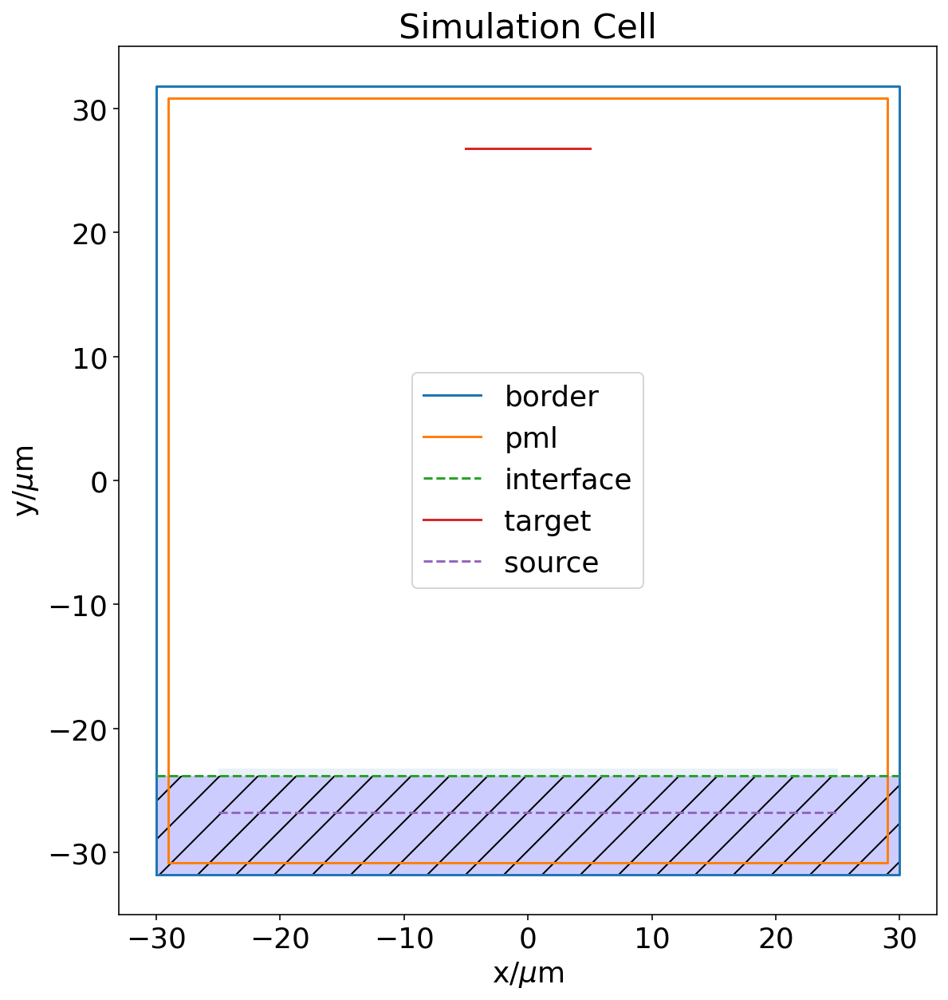

In [60]:
metalens = {
    'post_height':simulation_parameters['post_height'],
    'R': 25,
    'd': 50,
    's': 3.,
    'H': 50,
    'gap': 4,
    'w': 5,
    'unit cell size': simulation_parameters['cell_width'],
    'epsilon': simulation_parameters['epsilon'],
    'phases': phases,
    'widths': post_widths,
    'wavelength': simulation_parameters['wavelength'],
    'min_width': 0.05,
    'pml_width': 1,
    'resolution': 60.,
    'sim_id': simulation_parameters['sim_id'],
    'simulation_parameters' : simulation_parameters,
    'complex_fields' : True,
    'save_output': False,
    'x_mirror_symmetry': True}
metalens = aux_params(metalens)
plot_simulation_cell(metalens)

In [61]:
metalens = make_metalens_geometry(metalens)

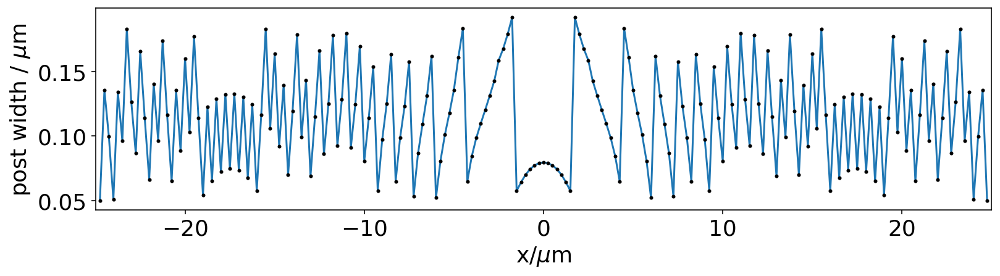

In [62]:
plot_phase_profile(metalens)

In [63]:
metalens = simulate_metalens(metalens)

-----------
Initializing structure...
     block, center = (0,-27.8,0)
          size (60,8,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.75,-23.5,0)
          size (0.05,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.5,-23.5,0)
          size (0.135479,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24.25,-23.5,0)
          size (0.0993931,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-24,-23.5,0)
          size (0.0508402,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.75,-23.5,0)
          size (0.134047,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.5,-23.5,0)
          size (0.0963095,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23.25,-23.5,0)
          size (0.182898,0.6,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-23,-23.5,0)
          size (0.126465,0.6,0)
          axes (1,0,0), (0

Meep progress: 38.641666666666666/119.771977826172 = 32.3% done in 347.0s, 728.6s to go
Meep progress: 39.09166666666667/119.771977826172 = 32.6% done in 351.1s, 724.6s to go
Meep progress: 39.541666666666664/119.771977826172 = 33.0% done in 355.1s, 720.6s to go
Meep progress: 39.983333333333334/119.771977826172 = 33.4% done in 359.2s, 716.8s to go
Meep progress: 40.425/119.771977826172 = 33.8% done in 363.2s, 712.9s to go
Meep progress: 40.858333333333334/119.771977826172 = 34.1% done in 367.3s, 709.3s to go
Meep progress: 41.3/119.771977826172 = 34.5% done in 371.3s, 705.5s to go
Meep progress: 41.75/119.771977826172 = 34.9% done in 375.4s, 701.5s to go
Meep progress: 42.19166666666666/119.771977826172 = 35.2% done in 379.4s, 697.7s to go
Meep progress: 42.641666666666666/119.771977826172 = 35.6% done in 383.5s, 693.6s to go
Meep progress: 43.083333333333336/119.771977826172 = 36.0% done in 387.5s, 689.7s to go
Meep progress: 43.53333333333333/119.771977826172 = 36.3% done in 391.6s,

Meep progress: 83.525/119.771977826172 = 69.7% done in 747.0s, 324.2s to go
Meep progress: 84.0/119.771977826172 = 70.1% done in 751.1s, 319.8s to go
Meep progress: 84.46666666666667/119.771977826172 = 70.5% done in 755.1s, 315.6s to go
Meep progress: 84.93333333333334/119.771977826172 = 70.9% done in 759.2s, 311.4s to go
Meep progress: 85.40833333333333/119.771977826172 = 71.3% done in 763.2s, 307.1s to go
Meep progress: 85.875/119.771977826172 = 71.7% done in 767.3s, 302.9s to go
Meep progress: 86.34166666666667/119.771977826172 = 72.1% done in 771.3s, 298.6s to go
Meep progress: 86.75833333333333/119.771977826172 = 72.4% done in 775.3s, 295.0s to go
Meep progress: 87.21666666666667/119.771977826172 = 72.8% done in 779.3s, 290.9s to go
Meep progress: 87.69166666666666/119.771977826172 = 73.2% done in 783.3s, 286.6s to go
Meep progress: 88.16666666666667/119.771977826172 = 73.6% done in 787.4s, 282.3s to go
Meep progress: 88.63333333333333/119.771977826172 = 74.0% done in 791.4s, 278.

In [108]:
metalens=compute_post_simulation_params(metalens)

In [65]:
! pushover "finished"

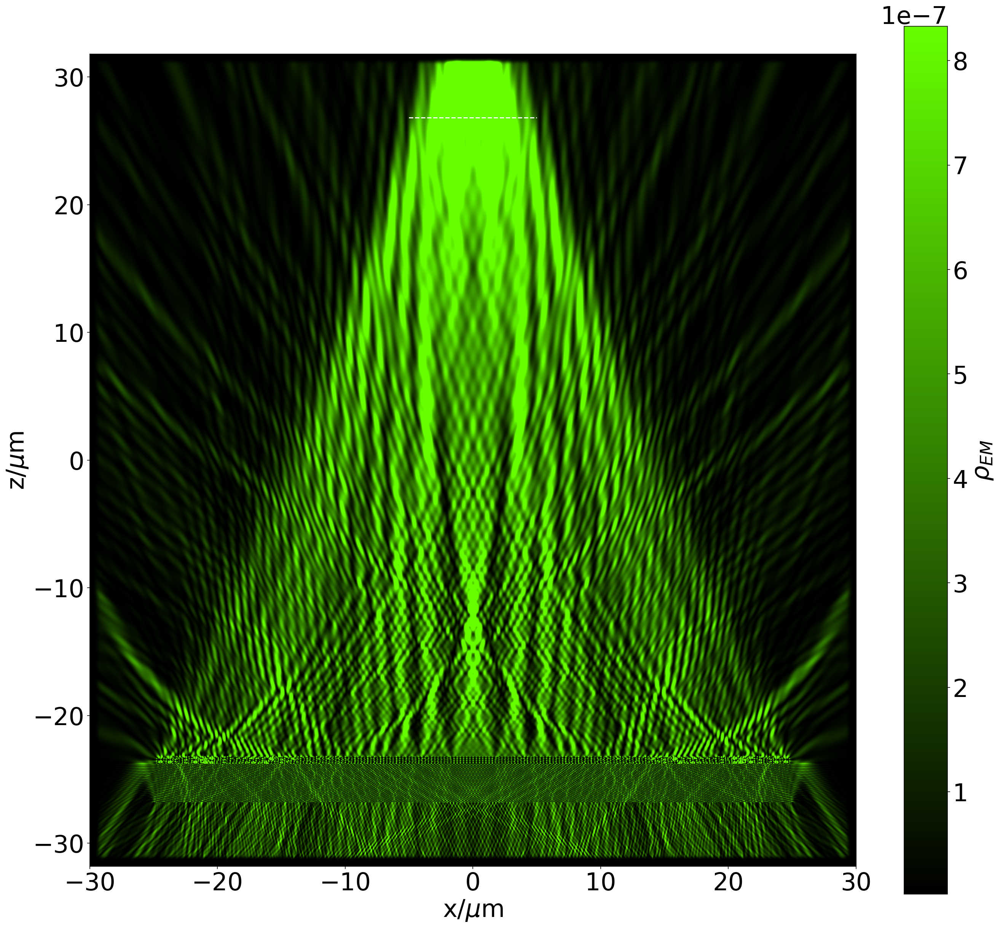

In [126]:
plot_density(metalens, 'rho_em')

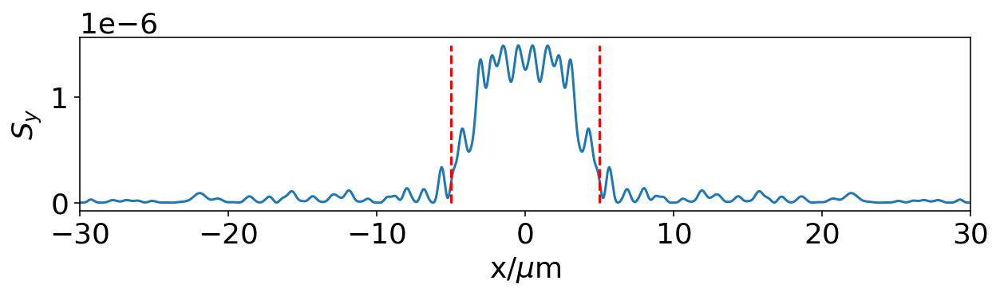

In [128]:
plt.rcParams.update({'font.size': 18})
plt.figure(figsize=(10,2))
plt.plot(metalens['transverse_axis'],metalens['Sy'][metalens['detector_plane_index']])
#plt.plot(metalens['transverse_axis'],metalens['e2'][metalens['max_axial_field_in_image_space']])
plt.plot([-metalens['w']]*2,[0,max(metalens['Sy'][metalens['detector_plane_index']])],'r--')
plt.plot([metalens['w']]*2,[0,max(metalens['Sy'][metalens['detector_plane_index']])],'r--')
plt.xlabel('x/$\mu$m')
plt.ylabel('$S_y$')
plt.xlim(-metalens['sim_cell_width']/2,
        metalens['sim_cell_width']/2)
plt.savefig('metalens-{sim_id}-top-cross-section.pdf'.format(**metalens),
           transparent=True)
plt.show()

In [123]:
print_params(metalens)

------------------------------  -----------------------
post_height                     0.60
R                               25
d                               50
s                               3.00
H                               50
gap                             4
w                               5
unit cell size                  0.25
epsilon                         5.84
wavelength                      0.53
min_width                       0.05
pml_width                       1
resolution                      60.00
sim_id                          1585246101
complex_fields                  True
save_output                     False
x_mirror_symmetry               True
aperture                        50
num of unit cells               199
ws                              25
fcen                            1.88
n                               2.42
wavelength_rgb                  2.42
k                               28.55
cmap                            28.55
sim_cell_width               